# C133 Team 5 K Nearest Neighbours (Refer to section 4 Directly)

### Section 1: Introduction and Observations
### Section 2: Cleaning
### Section 3: Exploratory Analysis
### Section 4: Model 1:K Nearest Neighbours with GridSearchCV and Bagging Model

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
import plotly.express as px
sb.set() # set the default Seaborn style for graphics

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor

from statistics import mean, median, mode, stdev
from math import sqrt

# Section 1: Introduction and Observations
Import and print the data

## objective of this project
3 main objectives / problems we are going to solve -> we are going to predict the the rating star of the phone
1) Help brands to improve their future qualities of phone by predicting the stars based on the phones specifications  <br>
2) Identify the most prominent variables and features of a phone resuting in a high star rating  <br>
3) Help users find the best rated phone that suit their preferences  <br>

In [2]:
original = pd.read_csv('mobiles.csv')
original.head()

,Unnamed: 0,names,images_links,stars,rating&reviews,price_details,memory,camara_info,display,battery,processor,warranty
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
2,2,itel it2163S,https://rukminim1.flixcart.com/image/312/312/l...,4.1,702 Ratings & 67 Reviews,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,9 Indian Input Language Support,"BT Caller, Kingtalker"
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...


In [3]:
original.dtypes



Unnamed: 0          int64
names              object
images_links       object
stars             float64
rating&reviews     object
price_details      object
memory             object
camara_info        object
display            object
battery            object
processor          object
warranty           object
dtype: object

In [4]:
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1148 entries, 0 to 1147
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      1148 non-null   int64  
 1   names           943 non-null    object 
 2   images_links    1143 non-null   object 
 3   stars           922 non-null    float64
 4   rating&reviews  922 non-null    object 
 5   price_details   1143 non-null   object 
 6   memory          943 non-null    object 
 7   camara_info     943 non-null    object 
 8   display         943 non-null    object 
 9   battery         943 non-null    object 
 10  processor       900 non-null    object 
 11  warranty        616 non-null    object 
dtypes: float64(1), int64(1), object(10)
memory usage: 107.8+ KB


### Observation 1, insignificant columns
1) From the described table, we are able to see that images_links does not have any data analysis value. They are simply links for the images of the phone. therefore be dropped.  <br>
2) The warranty of the phone varies as the user is able to extend their warranty; therefore, it is not important in this analysis and will be dropped.  <br>
3) The ratings and review columns are the same for the same brand and not the rating for each different type of phone, therefore not applicable to predicting which phone is better. and will be dropped.  <br>

### Observation 2: All columns except for "stars" are in string/object format.
Cleaning and formatting are needed so that the data can be analyzed.
a) Names - a new column will be created that substrings the brand (categorical).  <br>
b) Price details - the original price of the phone will be extracted from the string and converted to SGD (numerical).  <br>
c) Memory - contains 3 main components: RAM, ROM, and expandable storage (SD card) (numeric, numeric, boolean).  <br>
d) Camera info - the highest rear camera and front camera will be taken (numerical).  <br>
e) Display - will be split into 2 variables: size and type (numerical).  <br>
f) Battery - the number of the battery size is extracted (numerical).  <br>
g) Processor - there are a few null values which will be replaced by na (categorical).  <br>

Final columns:
a) Names  <br>
b) Price  <br>
c) RAM  <br>
d) ROM  <br>
e) Expandable (Y/N)  <br>
f) Front camera  <br>
g) Rear camera  <br>
h) ScreenSize  <br>
i) DisplayType  <br>
j) Battery  <br>
k) Processor  <br>
l) Color  <br>
m) Brand  <br>

### Observation 3: The rows with Apple phones seem to have an error in their storage section.
Extra details are inserted into the rows of Apple from other sources.

### Observation 4: There are a lot of null values.
The total number of rows is 1148, and the rows with names and model are 943.
1148 - 943 = 205 null phones.
All will be removed.

After Observation 2 is done, then we will do the exploratory analysis:

Show all the different types for categorical variables and the number of data in that category.
For numerical variables, show the descriptive statistics (mean, mode), box plot, and scatter plot.
For both data types, show the count of outliers.
Does any of the variables have any relationship with the stars?

### drop image_link and ratings_review and warranty

In [3]:
dropped = original.drop(columns=['images_links','rating&reviews','warranty'])
dropped = original.drop(columns=['images_links','rating&reviews'])

dropped.head()

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,9 Indian Input Language Support,"BT Caller, Kingtalker"
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...


### Remove null rows

In [4]:
dropped = dropped.dropna(subset=['names'])
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      900 non-null    object 
 9   warranty       616 non-null    object 
dtypes: float64(1), int64(1), object(8)
memory usage: 81.0+ KB


In [5]:
#create a column with the brand only using the names column
dropped['Brand']= dropped['names'].str.split(' ').str[0]


In [6]:
dropped.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      900 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
dtypes: float64(1), int64(1), object(9)
memory usage: 88.4+ KB


In [7]:
print(dropped['Brand'])

0        SAMSUNG
1        SAMSUNG
2           itel
3        SAMSUNG
4        SAMSUNG
          ...   
1138        vivo
1139        LAVA
1140       Tecno
1141    Kechaoda
1142       APPLE
Name: Brand, Length: 943, dtype: object


In [8]:
#it is observed that the apple rows have their processor saved in battery
#the following 2 row are used to transfer the row from battery to processor
#we then replace the battery with NA
dropped.loc[dropped['Brand'].str.upper()=='APPLE', 'processor'] = dropped['battery']
dropped.loc[dropped['Brand'].str.upper()=='APPLE', 'battery'] = 'NA'

#a few of the rows for processor does not have value, we replace with NA
dropped['processor'] = dropped['processor'].fillna('NA')

#afew rows have their warranty save under processor, we will replace it with NA
dropped.loc[dropped['processor'].str.upper().str.contains('YEAR'), 'processor'] = 'NA'

dropped.loc[dropped['processor'].str.upper().str.contains('LANGUAGE'), 'processor'] = 'NA'
dropped.loc[dropped['processor'].str.upper().str.contains('MONTH'), 'processor'] = 'NA'
dropped.loc[dropped['processor'].str.upper().str.contains('NA PROCESSOR'), 'processor'] = 'NA'

print(dropped['Brand']=='APPLE')

0       False
1       False
2       False
3       False
4       False
        ...  
1138    False
1139    False
1140    False
1141    False
1142     True
Name: Brand, Length: 943, dtype: bool


In [9]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix


In [10]:
dropped['Brand'].describe()

count      943
unique      40
top       itel
freq       120
Name: Brand, dtype: object

In [11]:
dropped['processor'].describe()

count     943
unique    121
top        NA
freq      339
Name: processor, dtype: object

In [12]:
#create a column called color from the name.
dropped['Color']= dropped['names'].str.split(',').str[0].str.split(' ').str[-1]
dropped['Color']= dropped['Color'].str.split('(').str[-1].str.upper()
dropped.loc[dropped['Color'].str.upper().str.contains('IT'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('VIR'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('SS'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('GRAY'), 'Color'] = 'GREY'
# Replace rows containing digits with NaN values
dropped['Color'] = dropped['Color'].replace(to_replace=r'\d+', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='X', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='XNA+', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='KNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='XNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='ENA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='TA-NA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='DS', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='GT-ENA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='RNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='WIFI', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='POWERNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='FLIP', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='KEYPAD', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='ULTRA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NEW', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='SUPER', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='JNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='ONYNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='FERRARI', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NA/NA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='TALKING', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NAN', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NAI', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NANA+', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='ANA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='YUVA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='POWER', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace="PRODUCT\)RED", value='RED', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='PRO', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='PLUS', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='KUNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='POWNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='GULNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='SNA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='RAFALE', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NAA+', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NAA', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='NA\+', value='NA', regex=True)
dropped['Color'] = dropped['Color'].replace(to_replace='MNA', value='NA', regex=True)



dropped['Color'].head(100)

0        BLUE
1      COPPER
2          NA
3       GREEN
4        BLUE
        ...  
115      BLUE
116     BLACK
117      BLUE
118        NA
119      GOLD
Name: Color, Length: 100, dtype: object

In [16]:
dropped['Color'].describe()

count     943
unique     70
top        NA
freq      356
Name: Color, dtype: object

## plot color to see if there is any relation to the rating (most likely not used as too many null)

In [17]:
#apple rows
print(dropped[dropped['Brand']=='APPLE'])

      Unnamed: 0                                           names  stars  \
16            16              APPLE iPhone 14 (Midnight, 128 GB)    4.7   
33            33                 APPLE iPhone 11 (White, 128 GB)    4.6   
42            42             APPLE iPhone 14 (Starlight, 128 GB)    4.7   
43            43                 APPLE iPhone 11 (Black, 128 GB)    4.6   
71            71                APPLE iPhone 14 (Purple, 128 GB)    4.7   
74            74                  APPLE iPhone 14 (Blue, 128 GB)    4.7   
78            78                  APPLE iPhone 11 (Black, 64 GB)    4.6   
184          184                 APPLE iPhone 12 (Black, 128 GB)    4.6   
235          235                  APPLE iPhone 11 (White, 64 GB)    4.6   
244          244                  APPLE iPhone 13 (Blue, 128 GB)    4.7   
255          255        APPLE iPhone 14 Plus (Starlight, 128 GB)    4.7   
263          263          APPLE iPhone 14 ((PRODUCT)RED, 128 GB)    4.7   
293          293         

In [18]:
#Memory section

dropped['Ram']= dropped['memory'].str.split('|').str[0]
dropped['Rom']= dropped['memory'].str.split('|').str[1]

#expandable or not column 
dropped.loc[dropped['memory'].str.upper().str.contains('EXPAND'), 'expandable'] = 1;
dropped['expandable'] = dropped['expandable'].fillna('0')


# replace the missing values with 0
dropped['Ram'] = dropped['Ram'].fillna('0 GB RAM')
dropped['Rom'] = dropped['Rom'].fillna('0 GB ROM')

#if the rom column contain ram and if the ram clomun comtain rom
dropped.loc[dropped['Ram'].str.upper().str.contains('ROM'), 'Rom'] = dropped['Ram'];
dropped.loc[dropped['Ram'].str.upper().str.contains('ROM'), 'Ram'] = '0 GB RAM';
dropped.loc[dropped['Rom'].str.upper().str.contains('Ram'), 'Ram'] = dropped['Rom'];
dropped.loc[dropped['Rom'].str.upper().str.contains('Ram'), 'Rom'] = '0 GB ROM';

#if the column contain NA RAM or NA ROM replace with 0 GB OR if they contain other data
dropped.loc[~dropped['Ram'].str.upper().str.contains('RAM') | dropped['Ram'].str.upper().str.contains('NA') , 'Ram'] = '0 GB RAM';
dropped.loc[~dropped['Rom'].str.upper().str.contains('ROM') | dropped['Rom'].str.upper().str.contains('NA') , 'Rom'] = '0 GB ROM';

# strip leading and trailing whitespace from the new columns
dropped['Ram'] = dropped['Ram'].str.strip()
dropped['Rom'] = dropped['Rom'].str.strip()


#convert ram and rom to numbers
dropped.loc[dropped['Ram'].str.upper().str.contains('MB'), 'Ram'] = str(dropped['Ram'].str.split(' ').str[0].astype('float') / 1000) + 'GB RAM'
dropped.loc[dropped['Rom'].str.upper().str.contains('MB'), 'Rom'] = str(dropped['Rom'].str.split(' ').str[0].astype('float') / 1000) + 'GB ROM'

#convert to float
dropped.loc[dropped['Ram'].str.upper().str.contains('RAM'), 'Ram'] = dropped['Ram'].str.split(' ').str[0].astype('float')
dropped.loc[dropped['Rom'].str.upper().str.contains('ROM'), 'Rom'] = dropped['Rom'].str.split(' ').str[0].astype('float')

dropped.to_csv('dropped.csv', index=False)

In [19]:
#apple 

dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 14'), 'Ram'] = 6.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 13'), 'Ram'] = 4.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 12'), 'Ram'] = 4.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 11'), 'Ram'] = 4.0



## things observed while formatting ram and rom

1) diff row have very different way of formatting their rom and ram  <br>
4 GB RAM | 64 GB ROM | Expandable Upto 1 TB  <br>
8 GB RAM | 128 GB ROM  <br>
128 GB ROM  <br>
NA ROM  <br>
6.6 cm (2.6 inch) QVGA Display  <br>
8 MB RAM | 8 MB ROM | Expandable Upto 32 GB  <br>
8 MB ROM | Expandable Upto 32 GB  <br>
### ! there are too many types of formatting, thus simply splitting wont work.
1) splitting will cause some ram column to have the rom value - thus need to swap  <br>
2) rows without data/NAN will be replace by 0 GB  <br>
3) after split can convert to int/float as there are some rows with screen data or NA RAM/ROM  <br>
4) replace all the rows with 'NA', or other strings that dont have 'RAM' or 'ROM' with 0  <br>
5) there is a mix of MB and GB, thus we need to convert those in mb by /1000  <br>
6) APPLE brand do not have ram data thus need to find external sources and input (40 rows)  <br>

NOTE: export to csv to check error

In [20]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0


In [21]:
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
dtypes: float64(3), int64(1), object(11)
memory usage: 150.2+ KB


### CHEE CHENG PART

In [22]:
# Split camera_info  column into two new columns , Rear Camera and Front Camera
dropped[['Rear Camera', 'Front Camera']] = dropped.camara_info.str.split("|", expand = True)
dropped[['Rear Camera', 'Front Camera']].describe()


,Rear Camera,Front Camera
count,943,527
unique,107,19
top,0.3MP Rear Camera,16MP Front Camera
freq,136,174


In [23]:
print(dropped["Rear Camera"].unique())

['50MP + 5MP + 2MP ' '1200 mAh Lithium Ion Battery' '13Mp + AI Lens '
 '2MP Rear Camera' '13MP Rear Camera ' '13MP + 2MP + 2MP '
 '50MP + 8MP + 2MP ' '50MP + 2MP ' '64MP + 8MP + 2MP ' '12MP + 12MP '
 '8MP Rear Camera ' '13MP + 2MP ' '0.3MP Rear Camera'
 '50MP + 2MP + 0.3MP ' '0MP Front Camera' '50MP + 8MP ' '50MP + AI Lens '
 '50MP + 0.3MP ' '50MP + 2MP + 2MP ' '48MP + 2MP + 2MP '
 '108MP + 8MP + 2MP ' '50 MP + 2 MP Depth Lens + AI Lens '
 '64MP + 8MP + 2MP + 2MP ' '8MP Dual Camera ' '50 MP + 2 MP + QVGA '
 '13MP Rear Camera' '50MP + 8MP + 2MP + 2MP ' '13MP + 2MP + 0.3MP '
 '108MP + 2MP + 2MP ' '5MP Rear Camera' '108MP + 2MP '
 '108MP + 8MP + 16MP ' '50MP + 0.3MP + 0.3MP ' '800 mAh Battery'
 '50MP Rear Camera' '1.3MP Rear Camera' '1000 mAh Battery'
 '1MP Rear Camera' '50MP (OIS) + 8MP + 2MP ' '48MP + 2MP '
 '108MP + 2MP (Depth) + 2MP (Macro) ' '8 MP + Depth Lens '
 '12.2MP + 12MP ' '50MP + 50MP + 2MP ' '50MP + 50MP ' '1750 mAh Battery'
 '64MP Rear Camera' '50MP + 2MP Depth Sensor + 2MP

After splitting and checking the unique values, it is noted that some rows have battery info in it. Also it is noted that there is a data with front camera in it. => replace both rear and front camera with 0 mp , since upon inspection of excel sheet that there is no data for the camera. ( 0 MP for both front and rear camera)

In [24]:
#Find the index which has the wrong value
indices = dropped[dropped['Rear Camera'].str.contains('mAh')].index

# print the indices
print(indices)

Int64Index([   2,   30,   58,   86,  114,  142,  170,  175,  187,  198,  213,
             226,  239,  254,  282,  291,  310,  321,  329,  338,  343,  366,
             367,  394,  406,  413,  422,  435,  440,  450,  478,  479,  484,
             488,  506,  534,  536,  551,  562,  563,  567,  571,  582,  590,
             592,  618,  620,  636,  646,  656,  665,  674,  684,  689,  702,
             712,  713,  729,  730,  743,  758,  760,  786,  789,  797,  814,
             842,  870,  872,  875,  876,  886,  897,  898,  910,  926,  954,
             982, 1010, 1037, 1038, 1041, 1044, 1066, 1094, 1096, 1100, 1122,
            1131, 1135],
           dtype='int64')


After checking with excel sheet seems like those that contain the wrong row also do not have camera info

In [25]:
# Extract datas with the first occurance of MP Rear Camera => this drops the battery info and front camera info and also the additional cameras.
dropped["Rear Camera"] = dropped["Rear Camera"].str.extract(r'(\d+MP)')

In [26]:
#after extracting, 0.08MP , 0.03MP 108 MP, became 08MP,03MP,10.08MP respectively, this replaces it to its true value.
dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('08MP', '0.08MP').str.replace('03MP', '0.03MP').str.replace('10.08MP', '108MP')

C:\Users\haoku\AppData\Local\Temp\ipykernel_13608\1562915345.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('08MP', '0.08MP').str.replace('03MP', '0.03MP').str.replace('10.08MP', '108MP')


In [27]:
# replace the missing values with 0MP
dropped['Rear Camera'] = dropped['Rear Camera'].fillna('0MP')

In [28]:
print(dropped["Rear Camera"].unique())

['50MP' '0MP' '2MP' '13MP' '64MP' '12MP' '8MP' '3MP' '48MP' '108MP' '5MP'
 '1MP' '0.08MP' '200MP' '16MP' '0.03MP' '32MP']


In [29]:
dropped["Rear Camera"].describe()

count      943
unique      17
top       50MP
freq       223
Name: Rear Camera, dtype: object

In [30]:
#convert datatype from object to float
dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('MP', '')
dropped["Rear Camera"] = dropped["Rear Camera"].astype('float64')

In [31]:
dropped["Rear Camera"].describe()

count    943.000000
mean      27.291220
std       31.572795
min        0.000000
25%        3.000000
50%       12.000000
75%       50.000000
max      200.000000
Name: Rear Camera, dtype: float64

In [32]:
print(dropped["Front Camera"].unique())

[' 8MP Front Camera' None ' 5MP Front Camera' ' 16MP Front Camera'
 ' 12MP Front Camera' ' 13MP Front Camera' ' 32MP Front Camera'
 ' 60 MP with OIS' ' 44MP Front Camera' ' 16MP + 2MP Dual Front Camera'
 ' 20MP Front Camera' ' 0MP Front Camera' ' 60MP Front Camera'
 ' 10.8MP Front Camera' ' 32MP + 2MP Dual Front Camera'
 ' 2MP Front Camera' ' 10MP Front Camera' ' 16MP + 16MP Dual Front Camera'
 ' 50MP + 8MP Dual Front Camera' ' 0.3MP Front Camera']


Noted there are multiple cameras as well => Take only the first occurance of the data with MP.

In [33]:
# Extract datas with the first occurance of Front Camera
dropped["Front Camera"] = dropped["Front Camera"].str.extract(r'(\d+MP)')

In [34]:
print(dropped["Front Camera"].unique())

['8MP' nan '5MP' '16MP' '12MP' '13MP' '32MP' '44MP' '20MP' '0MP' '60MP'
 '2MP' '10MP' '50MP' '3MP']


In [35]:
# replace the missing values with 0MP
dropped['Front Camera'] = dropped['Front Camera'].fillna('0MP')

In [36]:
dropped["Front Camera"].describe()

count     943
unique     14
top       0MP
freq      421
Name: Front Camera, dtype: object

In [37]:
#convert datatype from object to float
dropped["Front Camera"] = dropped["Front Camera"].str.replace('MP', '')
dropped["Front Camera"] = dropped["Front Camera"].astype('float64')

In [38]:
dropped["Front Camera"].describe()

count    943.000000
mean       6.925769
std        8.645459
min        0.000000
25%        0.000000
50%        5.000000
75%       12.000000
max       60.000000
Name: Front Camera, dtype: float64

In [39]:
# Split Display column into two new columns Length and Display
dropped[['Length', 'Display']] = dropped.display.str.split(")", expand = True)
dropped[['Length', 'Display']].describe()

,Length,Display
count,943,942
unique,52,18
top,4.57 cm (1.8 inch,Display
freq,134,245


In [40]:
print(dropped["Length"].unique())

['16.76 cm (6.6 inch' '4.57 cm (1.8 inch' '17.32 cm (6.82 inch'
 '16.59 cm (6.53 inch' '16.64 cm (6.55 inch' '17.02 cm (6.7 inch'
 '16.33 cm (6.43 inch' '15.49 cm (6.1 inch' '16.51 cm (6.5 inch'
 '16.26 cm (6.4 Inch' '7.11 cm (2.8 inch' '4.5 cm (1.77 inch'
 '16.26 cm (6.4 inch' '16.36 cm (6.44 inch' '16.66 cm (6.56 inch'
 '16.71 cm (6.58 inch' '16.56 cm (6.52 inch' '16.43 cm (6.47 inch'
 '17.07 cm (6.72 inch' '5.08 cm (2 inch' '16.94 cm (6.67 inch'
 '6.1 cm (2.4 inch' '3.81 cm (1.5 inch' '16.74 cm (6.59 inch'
 '15.6 cm (6.14 inch' '16.54 cm (6.51 inch' '3.66 cm (1.44 inch'
 '16.81 cm (6.62 inch' '15.9 cm (6.26 inch' '16.21 cm (6.38 inch'
 '17.22 cm (6.78 inch' '17.27 cm (6.8 inch' '3.56 cm (1.4 inch'
 '6.6 cm (2.6 inch' '17.53 cm (6.9 inch' '16.0 cm (6.3 inch'
 '16.69 cm (6.57 inch' '1.68 cm (0.66 inch' '13.84 cm (5.45 inch'
 '12.7 cm (5 inch' '16.55 cm (6.517 inch' '7.11 cm (2.8 Inch'
 '2MP Rear Camera' '16.55 cm (6.515 inch' '17.78 cm (7 inch'
 '16.97 cm (6.68 inch' '10.16 cm (4 inch

Noted there is  Rear Camera , meaning needs to replace the row with the correct value.

In [41]:
#Find the index which has the wrong value
indices = dropped[dropped['Length'].str.contains('Rear Camera')].index

# print the indices
print(indices)

Int64Index([886], dtype='int64')


In [42]:
#Since only one index has wrong value, we can replace it manually by double checking with excel
dropped["Length"] = dropped["Length"].str.replace('2MP Rear Camera', '2.6 inch')

In [43]:
#only extract the inch from the length column
dropped["Length"] = dropped["Length"].str.extract(r'(\d+\.?\d*\s*inch)').fillna('0')

In [44]:
dropped["Length"].unique()

array(['6.6 inch', '1.8 inch', '6.82 inch', '6.53 inch', '6.55 inch',
       '6.7 inch', '6.43 inch', '6.1 inch', '6.5 inch', '0', '2.8 inch',
       '1.77 inch', '6.4 inch', '6.44 inch', '6.56 inch', '6.58 inch',
       '6.52 inch', '6.47 inch', '6.72 inch', '2 inch', '6.67 inch',
       '2.4 inch', '1.5 inch', '6.59 inch', '6.14 inch', '6.51 inch',
       '1.44 inch', '6.62 inch', '6.26 inch', '6.38 inch', '6.78 inch',
       '6.8 inch', '1.4 inch', '2.6 inch', '6.9 inch', '6.3 inch',
       '6.57 inch', '0.66 inch', '5.45 inch', '5 inch', '6.517 inch',
       '6.515 inch', '7 inch', '6.68 inch', '4 inch', '6.22 inch',
       '6.95 inch', '6.088 inch', '5.4 inch', '6.08 inch'], dtype=object)

In [45]:
#convert datatype from object to float
dropped["Length"] = dropped["Length"].str.replace('inch', '')
dropped["Length"] = dropped["Length"].astype('float64')

In [46]:
dropped["Length"].describe()

count    943.000000
mean       4.896543
std        2.190757
min        0.000000
25%        2.400000
50%        6.440000
75%        6.600000
max        7.000000
Name: Length, dtype: float64

In [47]:
dropped["Display"].describe()

count          942
unique          18
top        Display
freq           245
Name: Display, dtype: object

In [48]:
print(dropped["Display"].unique())

[' Full HD+ Display' ' Quarter QVGA Display' ' HD+ Display' ' Display'
 ' Full HD+ AMOLED Display' ' Super Retina XDR Display' ' HD Display'
 ' Liquid Retina HD Display' ' QVGA Display' ' NA Display'
 ' Full HD+ Super AMOLED Display' ' Full HD Display'
 ' Full HD+ E3 Super AMOLED Display' ' Quad HD+ Display' None
 ' FWVGA Display' ' WVGA Display' ' VGA Display' ' FWVGA+ Display']


In [49]:
# replace the missing values with None
dropped["Display"] = dropped["Display"].fillna('None')

In [50]:
dropped["Display"].describe()

count          943
unique          19
top        Display
freq           245
Name: Display, dtype: object

In [51]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable,Rear Camera,Front Camera,Length,Display
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0,0.0,0.0,1.80,Quarter QVGA Display
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0,2.0,0.0,1.80,Display
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display


In [52]:
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

### Vignesh Part
1) Brand (the code is above) <br>
2) Battery <br>
3) Price <br>


## Price

In [53]:
#Price Details

#Exchange rate is fixed at this: 1 Indian Rupee is 0.016 Singapore Dollar as of March 2023

#Create a new column called 'Price'
dropped['Price'] = dropped['price_details'].str.split().str[0]

#Remove the comma and change the value using the exchange rate and changing the currency symbol in the process
dropped['Price'] = dropped['Price'].str.replace("₹", "")
dropped['Price'] = dropped['Price'].str.replace(",", "")

#Type casting to int to update the value using the exchange rate and convert to float
dropped['Price'] = dropped['Price'].apply(lambda x: float(int(x) * 0.016) if str(x).isdigit() else 'NA')

print(dropped['Price'])

0        155.184
1        155.184
2         15.824
3        171.184
4        171.184
          ...   
1138     447.840
1139      95.840
1140     111.184
1141      22.384
1142    2159.984
Name: Price, Length: 943, dtype: float64


In [54]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable,Rear Camera,Front Camera,Length,Display,Price
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display,155.184
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display,155.184
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0,0.0,0.0,1.80,Quarter QVGA Display,15.824
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display,171.184
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display,171.184
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,143.984
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0,2.0,0.0,1.80,Display,13.584
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184


In [55]:
mobiles = dropped
mobiles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

## Battery

In [56]:
#Battery

# models of phones have their battery info in the wrong column
#Rows 177, 189, 215, 293, 323, 331, 345, 369, 408, 415, 437, 442, 481, 486, 490, 538, 565, 569, 573, 584, 594, 622, 638, 658, 667, 686, 691, 714, 715, 731, 745, 762, 791, 799, 874, 877, 878, 888, 899, 912, 1039, 1043, 1046, 1098, 1102, 1133, 1137

#For these rows, fetch the data from camera_info column.
indices = {175, 187, 213, 291, 321, 329, 343, 367, 406, 413, 435, 440, 479, 484, 488, 536, 563, 567, 571, 582, 592, 620, 636, 656, 665, 684, 689, 712, 713, 729, 743, 760, 789, 797, 872, 875, 876, 886, 897, 910, 1037, 1041, 1044, 1096, 1100, 1131, 1135}

#did a try except for those indexes that are removed
for index in indices:
    try:
    #Get the data from the camero_info column
        battery = mobiles['camara_info'].iloc[index]
    except:
        continue
    #Remove until second whitespace
    # split the string into words using whitespace as delimiter
    words = battery.split()

    # join the remaining words starting from the third word with a whitespace separator
    new_battery = ' '.join(words[:2])
        
    #mobiles['camara_info'].loc[index] = new_battery
    mobiles.loc[mobiles['camara_info'] == index, 'camara_info'] = new_battery
######################################################################    

# function to remove everything 2 whitespaces in front and everything beyond 'mAh'
def clean_battery_info(s):
    mah_index = s.find('mAh')
    if mah_index != -1:
        return s[s.rfind(' ', 0, mah_index-2) + 1:mah_index + 3]
    else:
        return s
    
#For every other models
mobiles['battery'] = mobiles['battery'].apply(clean_battery_info)
    
#Apple iPhones do not have any battery info in the csv thus external sources have to be used
#Data from GSMArena
mobiles.loc[mobiles['names'].str.contains('iPhone 14'), 'battery'] = "3279" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 14 Plus'), 'battery'] = "4323" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 14 Pro Max'), 'battery'] = "4323" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 13'), 'battery'] = "3240" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 13 Pro Max'), 'battery'] = "4352" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 12 mini'), 'battery'] = "2227" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 12'), 'battery'] = "2815" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 11'), 'battery'] = "3110" + " " + "mAh" 
    
#Store the battery values (the digit only) in a new column with capitalised B, 'Battery'    
mobiles['Battery'] = mobiles['battery'].str.extract(r'(\d+)').astype(float)

print(mobiles['Battery'])

print(mobiles.loc[mobiles['Brand'].str.contains('Apple'), 'Battery'])

0       6000.0
1       6000.0
2       1200.0
3       6000.0
4       6000.0
         ...  
1138    4000.0
1139    4060.0
1140    5000.0
1141    1700.0
1142    4352.0
Name: Battery, Length: 943, dtype: float64
Series([], Name: Battery, dtype: float64)


In [57]:
#for battery replace those less than 500 with 0
#replace those NULL with 0
mobiles['Battery'] = mobiles['Battery'].fillna(0)

mobiles.loc[dropped['Battery'].astype(float)<500, 'Battery'] = 0;

In [58]:
mobiles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

## mobiles is a duplicate of the table
### columns dropped
1)price_details
2)memory
3)camara_info
4)display
5)battery
6)warranty


In [59]:
Cleaned = mobiles.drop(columns=['price_details','memory', 'camara_info', 'display', 'battery', 'warranty'])
Cleaned.rename({'names': 'Names', 'stars': 'Stars', 'expandable': 'Expandable', 'processor': 'Processor', 'Display': 'DisplayType', 'Length': 'ScreenSize'}, axis=1, inplace=True)
#Cleaned.to_csv('cleaned.csv', index=False)
Cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         922 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


# Section 3: Exploratory Analysis 
(Use the Cleaned Dataframe)
The name of the cleaned table is 'Cleaned'

Exploratory Data Analysis
Let us start by exploring the response variable 'Stars', the one we are supposed to predict at the end of the day.
Stars refer to the rating of the phone from 0.0-5.0

In [60]:
##exploatory Analysis below
Cleaned.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         922 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


<AxesSubplot:>

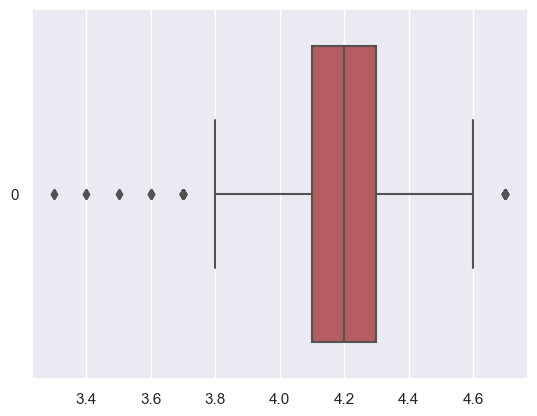

In [61]:
sb.boxplot(data=Cleaned['Stars'], orient = "h", color = 'r')

In [62]:
Cleaned["Stars"].describe()

count    922.000000
mean       4.185575
std        0.235729
min        3.300000
25%        4.100000
50%        4.200000
75%        4.300000
max        4.700000
Name: Stars, dtype: float64

In [63]:
#create a function to find outliers using IQR

def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [64]:
outliers = find_outliers_IQR(Cleaned["Stars"])
print("number of outliers for Stars: "+ str(len(outliers)))
print('\n')
# Number of null = 943-922 = 21 null values for Stars
print("number of NULL for Stars: 21")

number of outliers for Stars: 88


number of NULL for Stars: 21


We see that there are afew null and outliers in Stars which may affect the prediction model later

In [64]:
# Numeric Predictors
Cleaned[['Stars','Ram','Rom', 'Rear Camera', 'Front Camera', 'Price', 'Battery', 'ScreenSize']].describe()

,Stars,Ram,Rom,Rear Camera,Front Camera,Price,Battery,ScreenSize
count,922.000000,943.000000,943.000000,943.000000,943.000000,943.000000,943.000000,943.000000
mean,4.185575,3.438625,68.555938,27.291220,6.925769,223.320365,3553.969247,4.896543
std,0.235729,3.112900,69.838110,31.572795,8.645459,291.478165,1871.337150,2.190757
min,3.300000,0.000000,0.000000,0.000000,0.000000,11.904000,0.000000,0.000000
25%,4.100000,0.000000,0.000000,3.000000,0.000000,23.984000,1450.000000,2.400000
50%,4.200000,4.000000,64.000000,12.000000,5.000000,151.984000,4800.000000,6.440000
75%,4.300000,6.000000,128.000000,50.000000,12.000000,263.984000,5000.000000,6.600000
max,4.700000,12.000000,512.000000,200.000000,60.000000,2159.984000,7000.000000,7.000000


In [65]:
# Categorical Predictors
Cleaned[['Processor','Brand','Color','Expandable','DisplayType']].describe()

,Processor,Brand,Color,Expandable,DisplayType
count,943,943,943,943.0,943
unique,121,40,151,2.0,19
top,NA,itel,NA,1.0,Display
freq,339,120,170,584.0,245


Not much informations yet
- There are phones without length and battery data
- Ram, Rom Front camera have no lower outliers as the 25% is same as the min
- the processor and color have a very large amount of rows without data, therefore most likely unable to use for prediction
- Processor have 339 NA rows
- Color have 170 NA rows
- Intel is the brand with the highest amout of rows(120)
- There are 584 phones that support expandable memory
- There are 19 type of Display with 'Display' being the most commmon(245)


## Correlation stars vs all numerical predictor

In [66]:
correlation_matrix = Cleaned.corr()
correlation_matrix["Stars"]

Unnamed: 0     -0.210864
Stars           1.000000
Ram             0.474569
Rom             0.477503
Rear Camera     0.340169
Front Camera    0.383422
ScreenSize      0.549877
Price           0.494330
Battery         0.495736
Name: Stars, dtype: float64

## Correlation
Rear and Front camera have a weak positive correlation with stars
Ram, Rom, price, battery and screen size have a moderate positive coorellation

#### Time for some visualizations to check the distribution of the predictor variables, one by one, for both Numeric and Categorical predictors. However, we will not just do it sequentially as they appear in the dataset as columms. We will do based on what the variable describe. <br>
 -Memory: Ram, Rom, Expandable<br>
 -Camera: Rear, Front <br>
 -Display: ScreenSize, DisplayType <br>
 -Names: Names, Brand, Color <br>
 -Processor <br>
 -Battery <br>
 -Price <br>
 

### Predictor corresponding to Memory (Ram, Rom, Expandable)

<AxesSubplot:xlabel='Ram', ylabel='Count'>

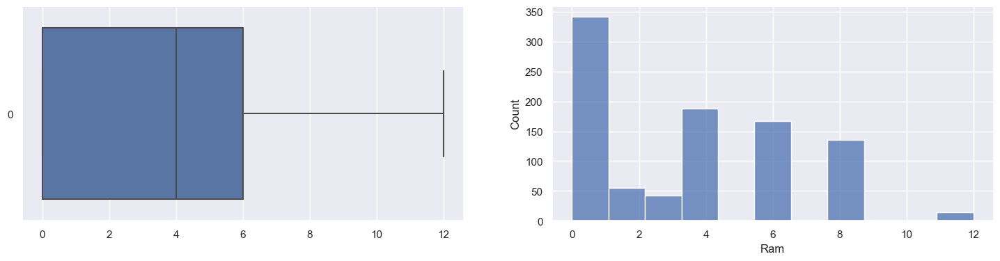

In [67]:
#Ram 
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = Cleaned['Ram'], orient = "h", ax = axes[0])
sb.histplot(data = Cleaned['Ram'], ax = axes[1])

- Data are generally skewed to the right, with no outliers <br>
- 0 have the highest count for RAM and 12 have the lowest count<br>
- from the histogram generally as ram increases the count decrease<br>

<AxesSubplot:xlabel='Rom', ylabel='Count'>

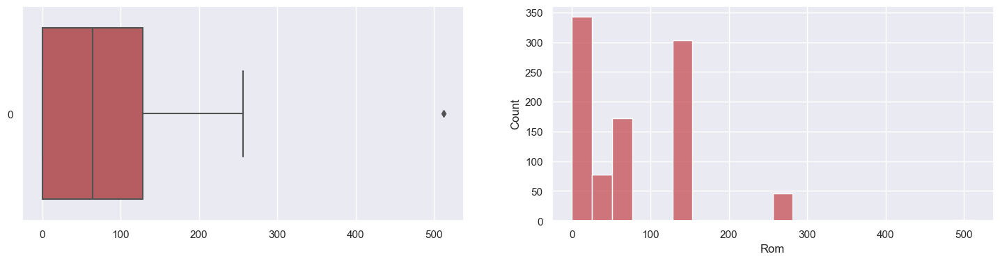

In [68]:
#Rom
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = Cleaned['Rom'], orient = "h", ax = axes[0], color = 'r')
sb.histplot(data = Cleaned['Rom'], ax = axes[1],color = 'r')

- There is outliears whose Rom are above 500GB <br>
- generally the Rom are around 0 to ~250GB <br>
- 0 have the highest count for ROM <br>
- unlikely to have phone without rom storage, might need to be replace with median or removed for a more accurate analysis<br>

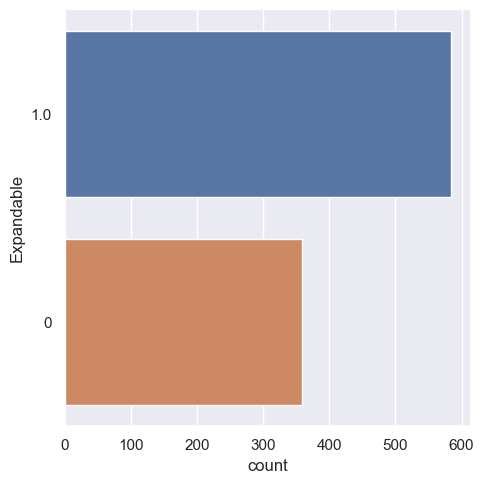

In [69]:
#expandable
sb.catplot(y = 'Expandable', data = Cleaned, kind = "count")

- Most phone supports expandable memory (1) <600
- <400 phone does not support expandable memory

### Predictor corresponding to Processor

<AxesSubplot:xlabel='Count', ylabel='Processor'>

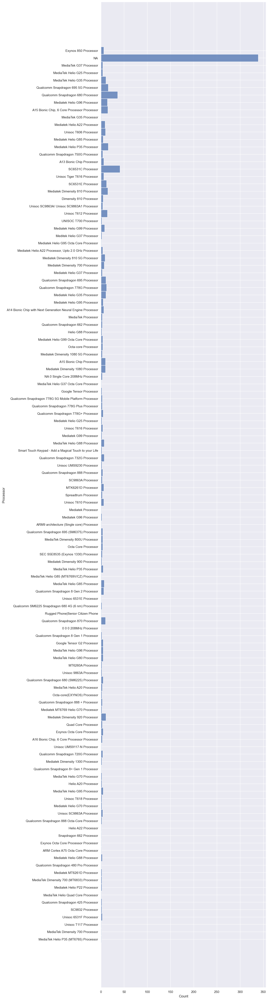

In [70]:
fig, ax = plt.subplots(figsize=(10, 60))

processor_counts = Cleaned["Processor"].value_counts()

# Get order based on count
processor_order = processor_counts.index.tolist()

# Create histogram with sorted order
#sb.barplot(, orient = 'h', y=Cleaned["Processor"], order =processor_order)
sb.histplot(data=Cleaned, y="Processor",bins=len(processor_order))


The majority of the phone listed does not have their processor details, thus processor might not be the best predictor unless cleaning is done.
there are very scarce phones that uses the same processor

### Predictor corresponding to color
Some minor Cleaning

<AxesSubplot:xlabel='Count', ylabel='Color'>

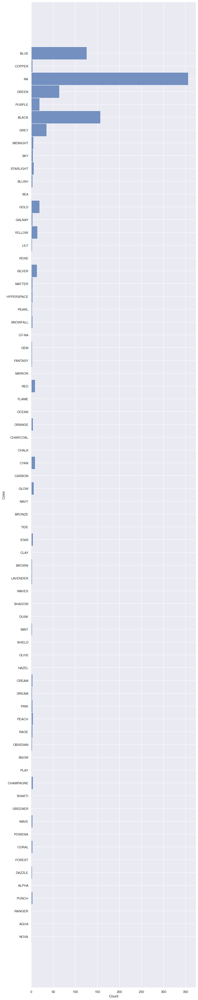

In [65]:

Cleaned['Color'].unique()


#plot
fig, ax = plt.subplots(figsize=(10, 60))
sb.histplot(y = 'Color', data = Cleaned, ax=ax)


-A large number of phones do not have a declared color <br>
- other than NA the next highest is black <br>
- there are too many color that might be too similar eg. blue&sea, copper&gold but we can just decide that they are the same color <br>

### Predictor corresponding to Camera(Front, Rear)

<AxesSubplot:xlabel='Rear Camera', ylabel='Count'>

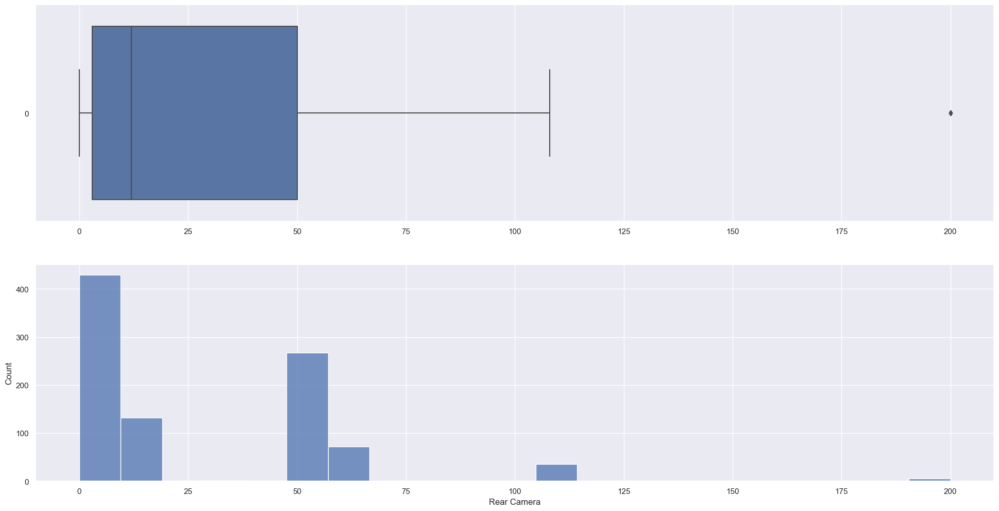

In [72]:
#rear Camera
# Set up matplotlib figure with two subplots
f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["Rear Camera"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["Rear Camera"], ax=axes[1])

<AxesSubplot:xlabel='Front Camera', ylabel='Count'>

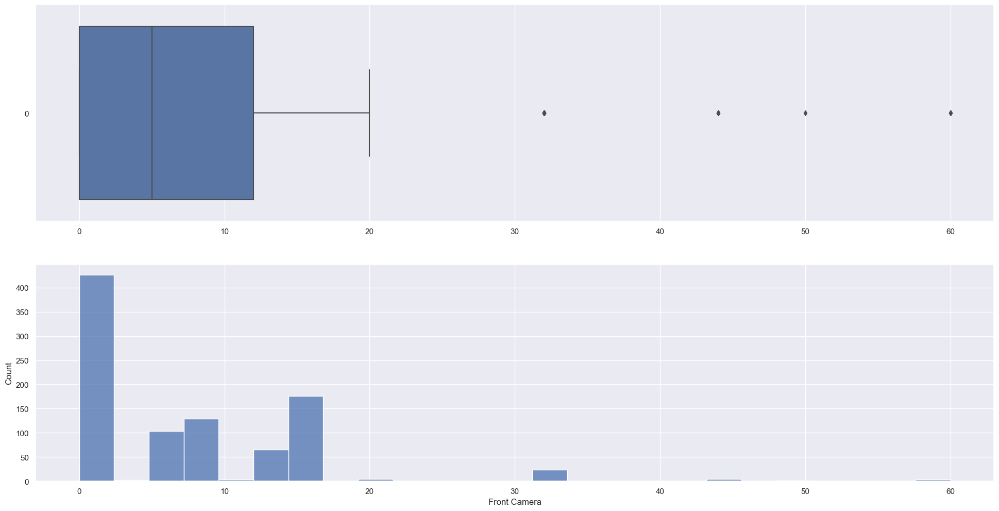

In [73]:
#Front Camera
# Set up matplotlib figure with two subplots
f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["Front Camera"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["Front Camera"], ax=axes[1])

### Predictor corresponding to Screen(ScreenSize, ScreenType)

<AxesSubplot:xlabel='ScreenSize', ylabel='Count'>

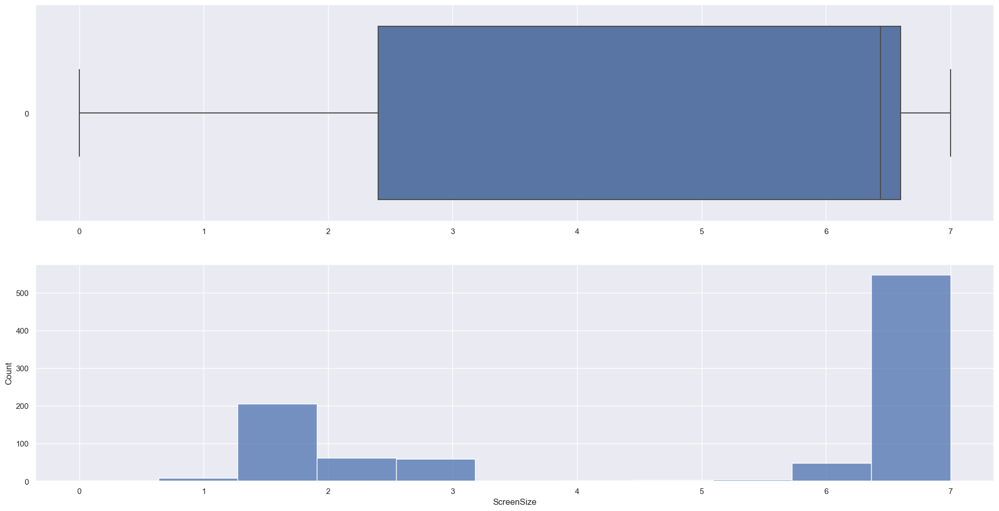

In [74]:
#screen Size
# Set up matplotlib figure with two subplots

f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["ScreenSize"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["ScreenSize"], ax=axes[1])

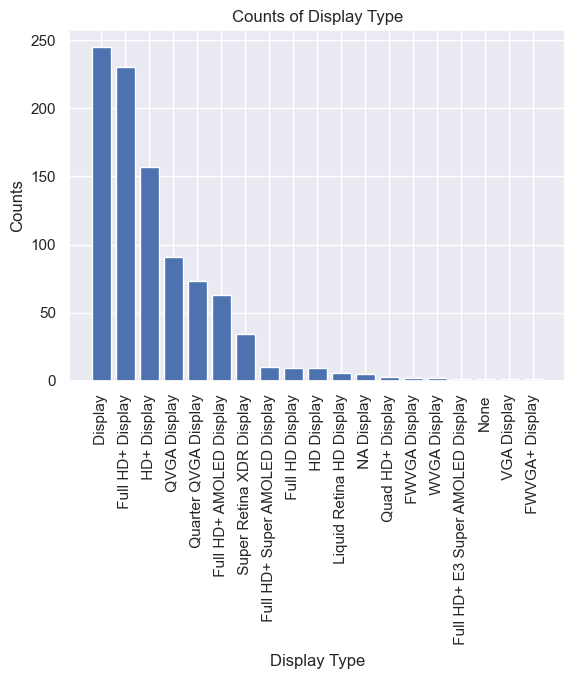

In [75]:
#screenType
# get the counts of unique values in the "DisplayType" column
counts = Cleaned['DisplayType'].value_counts()

# create a bar chart
plt.bar(counts.index, counts)

# set the title and axis labels
plt.title("Counts of Display Type")
plt.xlabel("Display Type")
plt.ylabel("Counts")

# adjust the margins and rotate the x-axis labels
plt.subplots_adjust(bottom=0.15)
plt.xticks(rotation=90)

# show the plot
plt.show()

### Predictor corresponding to Brand

<AxesSubplot:xlabel='Count', ylabel='Brand'>

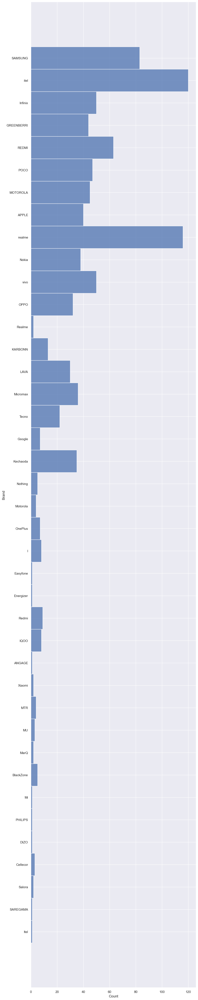

In [76]:
#plot
fig, ax = plt.subplots(figsize=(10, 60))
sb.histplot(y = 'Brand', data = Cleaned, ax=ax)

### Predictor corresponding to Battery

<AxesSubplot:>

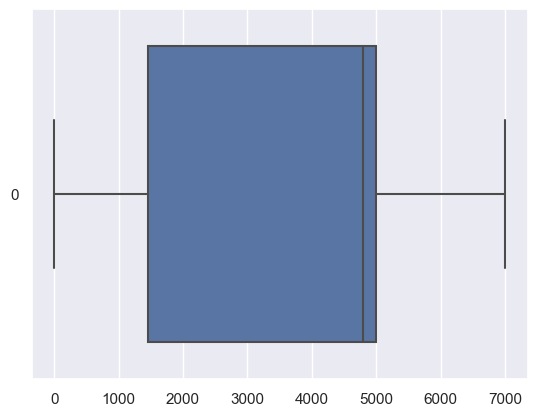

In [77]:
#Battery exploratory analysis

sb.boxplot(data=Cleaned['Battery'], orient = "h", color = 'b')

### Predictor corresponding to Price

<AxesSubplot:>

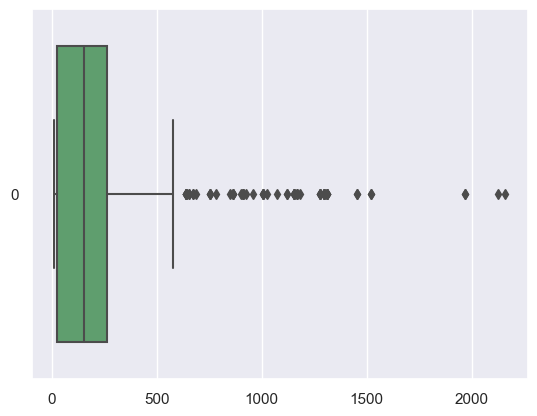

In [78]:
#Price exploratory analysis

#Box plot for price
sb.boxplot(data=Cleaned['Price'], orient = "h", color = 'g')

# Relationship with Rating

## Stars with Ram, Rom, Expandable, Processor, Color

Correlation:  0.4745694857863057


<Figure size 1600x800 with 0 Axes>

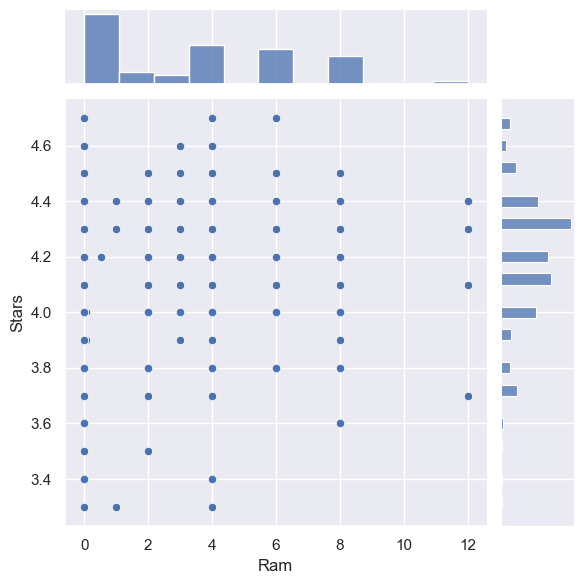

In [79]:
#RAM

f = plt.figure(figsize=(16, 8))
correlation = Cleaned['Ram'].corr(Cleaned['Stars'])

print('Correlation: ',correlation)
sb.jointplot(x = 'Ram', y = 'Stars', data = Cleaned)
plt.show()

### Ram with stars
- from the scatter plot there is no obvious relationship <br>
- the corelation is 0.474 which have a weak positive correlation <br>
- Ram might be a potential predictor for stars <br>

Correlation:  0.47750271813509204


<Figure size 1600x800 with 0 Axes>

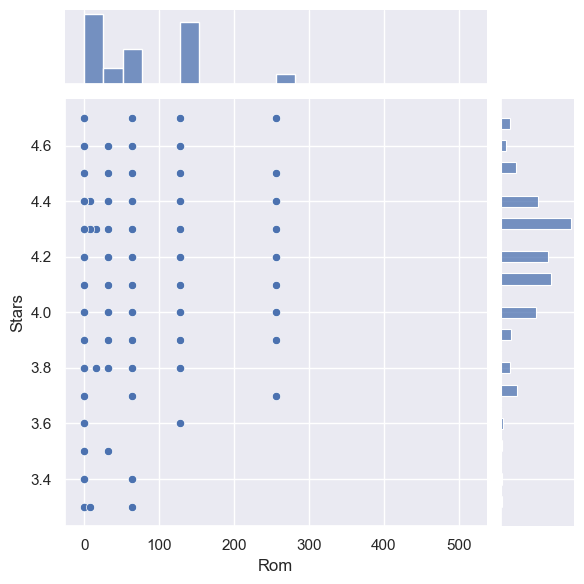

In [80]:
#ROM

f = plt.figure(figsize=(16, 8))
correlation = Cleaned['Rom'].corr(Cleaned['Stars'])

print('Correlation: ',correlation)
sb.jointplot(x = 'Rom', y = 'Stars', data = Cleaned)
plt.show()

### Rom with stars
- from the scatter plot there is no obvious relationship <br>
- the corelation is 0.477 which have a weak positive correlation <br>
- Rom might be a potential predictor for stars <br>

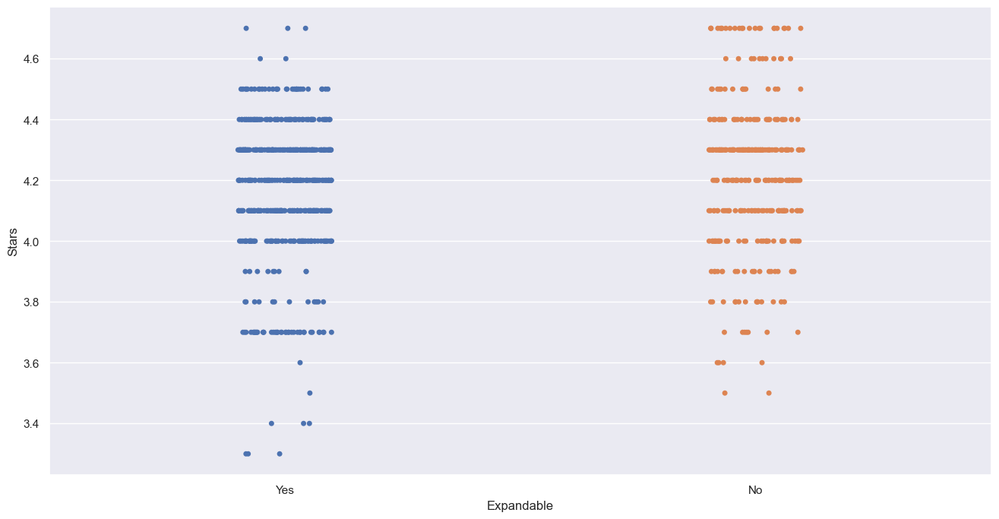

In [81]:
#expandable vs Stars

Cleaned['Expandable'] = Cleaned['Expandable'].replace(to_replace=1, value='Yes', regex=True)
Cleaned['Expandable'] = Cleaned['Expandable'].replace(to_replace='0', value='No', regex=True)

f = plt.figure(figsize=(16, 8))
sb.stripplot(x = 'Expandable', y = 'Stars', data = Cleaned)
plt.show()

### Expandable with stars
- from the scatter plot there is no obvious relationship <br>
- how ever phone with expandable memory have ratings that are 3.4 & below
- Phones without expandable memomry seems to have more datapoint for stars above 4.6 <br>
- Expandable memory might be a good predictor <br>

<AxesSubplot:xlabel='Stars', ylabel='Processor'>

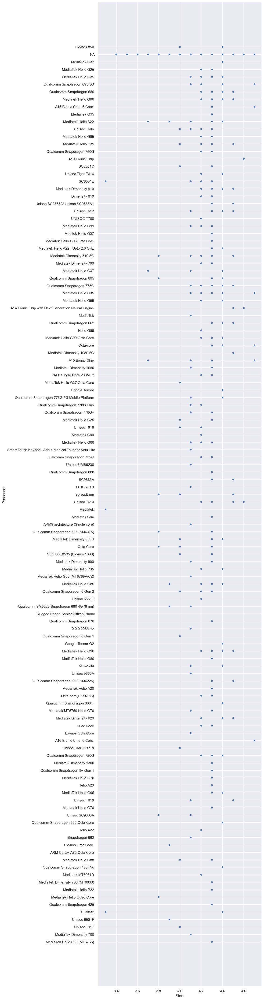

In [82]:
#Processor

Cleaned['Processor'] = Cleaned['Processor'].str.replace('Processor', '')

fig, ax2 = plt.subplots(figsize=(10, 60))

# adjust the spacing between the subplots
plt.subplots_adjust(top=0.9, right=0.9, left=0.2, bottom=0.2)
sb.scatterplot(x = 'Stars', y = 'Processor', data = Cleaned,ax=ax2)


### Processor with stars

- There is no obvious relationship <br>
- NA seems to have the Stars of all values
- SC9832 have the lowest stars
- Too little data that uses the same processor. This causes the data to be very spread out

<AxesSubplot:xlabel='Stars', ylabel='Color'>

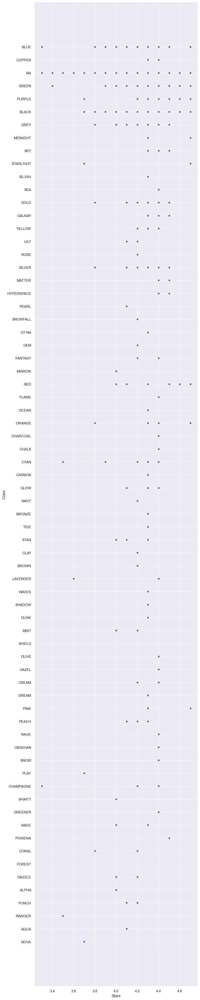

In [83]:
#Color

fig, ax2 = plt.subplots(figsize=(10, 60))

# adjust the spacing between the subplots
plt.subplots_adjust(top=0.9, right=0.9, left=0.2, bottom=0.2)
sb.scatterplot(x = 'Stars', y = 'Color', data = Cleaned,ax=ax2)

### Color with Stars
- NA have data for all values of stars
- copper have quite a high stars
- midnight have a high Stars
- The lowest stars is from champagne color
- although black is the highest color aside from NA, the ratings are generally above 3.7

## Stars with Rear Camera, Front Camera, ScreenSize, ScreenType

### Rear Camera with Stars
Generally the corelation is positive, which means when MP of rear camera increase, the value of Stars increase. However the corelation is too weak (<0.5) so Rear Camera may not be a good variable to determine Stars.

In [84]:
# Create a joint dataframe by concatenating the two variables
jointDF = pd.concat([Cleaned["Rear Camera"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF


,Rear Camera,Stars
0,50.0,4.4
1,50.0,4.4
2,0.0,4.1
3,50.0,4.4
4,50.0,4.4
...,...,...
1138,64.0,4.0
1139,13.0,4.3
1140,8.0,4.1
1141,3.0,4.6


0.34016946680243615


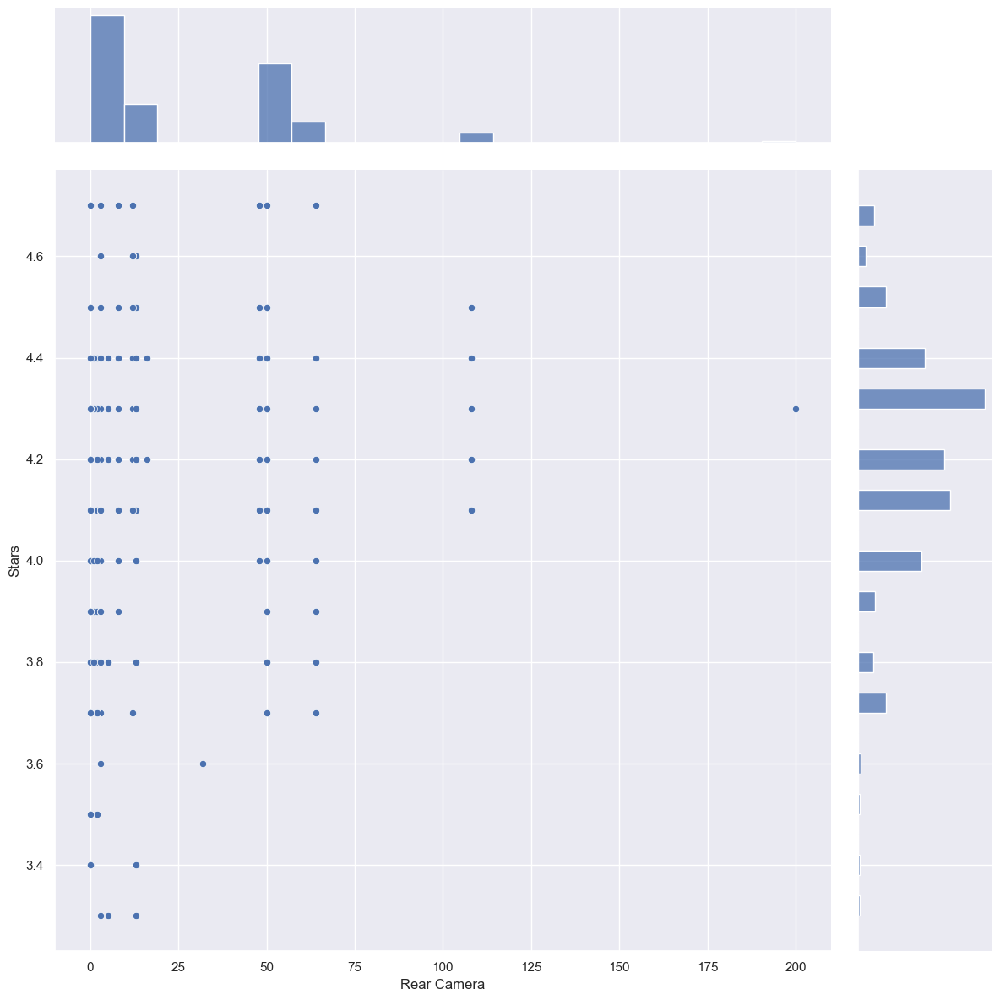

In [85]:
corr1 = Cleaned["Rear Camera"].corr(Cleaned["Stars"])

print(corr1)

# Draw jointplot of rear camera VS Stars in the joined dataframe
sb.jointplot(data=jointDF, x="Rear Camera", y="Stars", height=12)

### Front Camera with Stars
Generally the corelation is positive, which means when MP of rear camera increase, the value of Stars increase. However the corelation is too weak (<0.5) so Rear Camera may not be a good variable to determine Stars.

In [86]:
# Create a joint dataframe by concatenating the two variables
jointDF2 = pd.concat([Cleaned["Front Camera"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF2

,Front Camera,Stars
0,8.0,4.4
1,8.0,4.4
2,0.0,4.1
3,8.0,4.4
4,8.0,4.4
...,...,...
1138,44.0,4.0
1139,0.0,4.3
1140,0.0,4.1
1141,0.0,4.6


0.3834221549452544


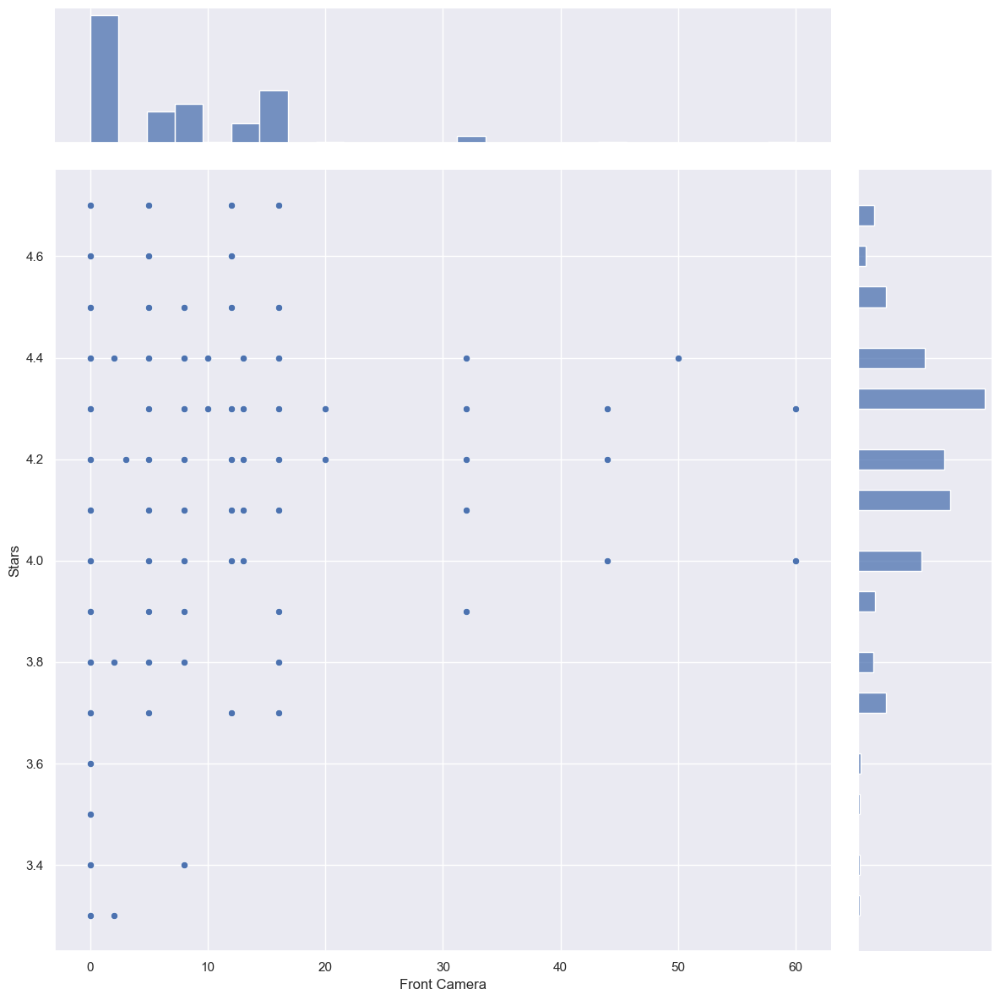

In [87]:
#print the correlationship
corr2 = Cleaned["Front Camera"].corr(Cleaned["Stars"])

print(corr2)

# Draw jointplot of Front camera VS Stars in the joined dataframe
sb.jointplot(data=jointDF2, x="Front Camera", y="Stars", height=12)

### ScreenSize with Stars

In [88]:
# Create a joint dataframe by concatenating the two variables
jointDF3 = pd.concat([Cleaned["ScreenSize"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF3

,ScreenSize,Stars
0,6.60,4.4
1,6.60,4.4
2,1.80,4.1
3,6.60,4.4
4,6.60,4.4
...,...,...
1138,6.44,4.0
1139,6.08,4.3
1140,6.56,4.1
1141,2.40,4.6


0.5498768072960432


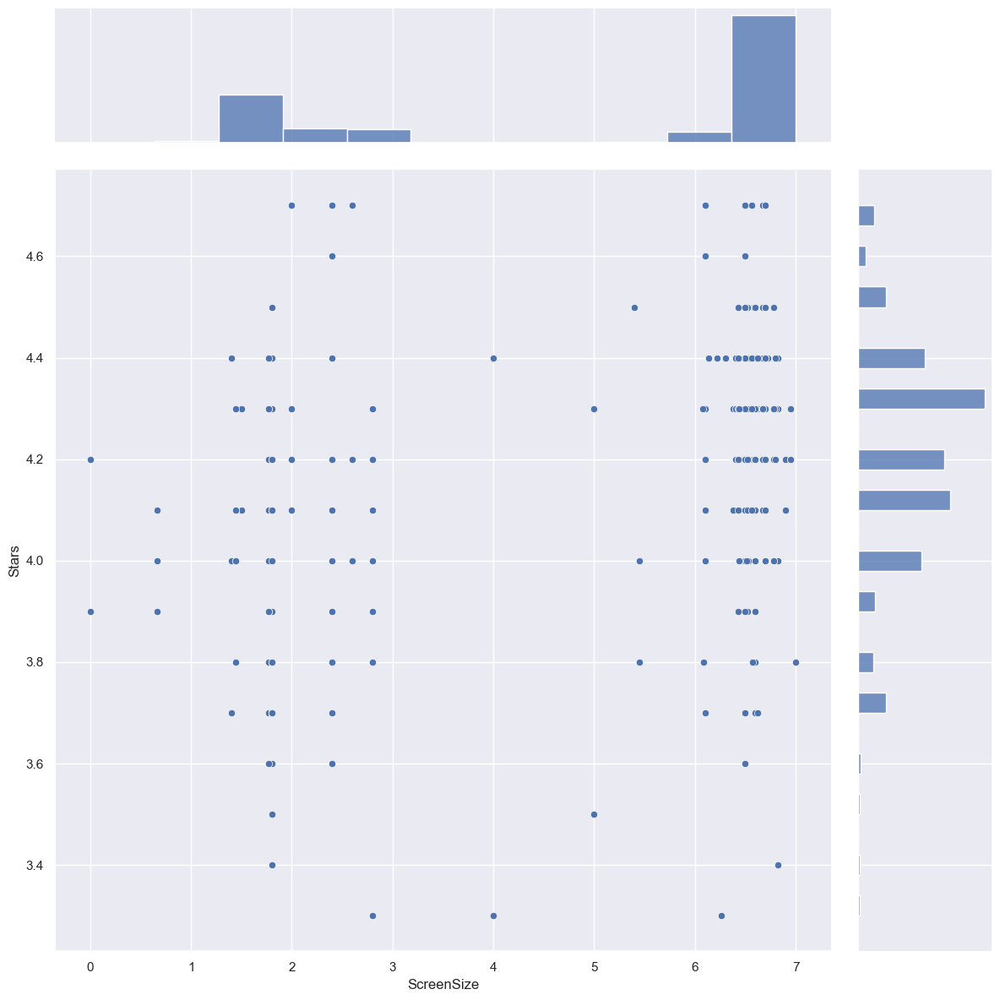

In [89]:
corr3 = Cleaned["ScreenSize"].corr(Cleaned["Stars"])

print(corr3)
# Draw jointplot of screensize vs stars 
sb.jointplot(data=jointDF3, x="ScreenSize", y="Stars", height=12)

The corelation is positive, which means when MP of front camera increase, the value of Stars increase. The corelation is abit weak as it is near 0.5. Possible factor in determining value of stars.

### DisplayType with Stars

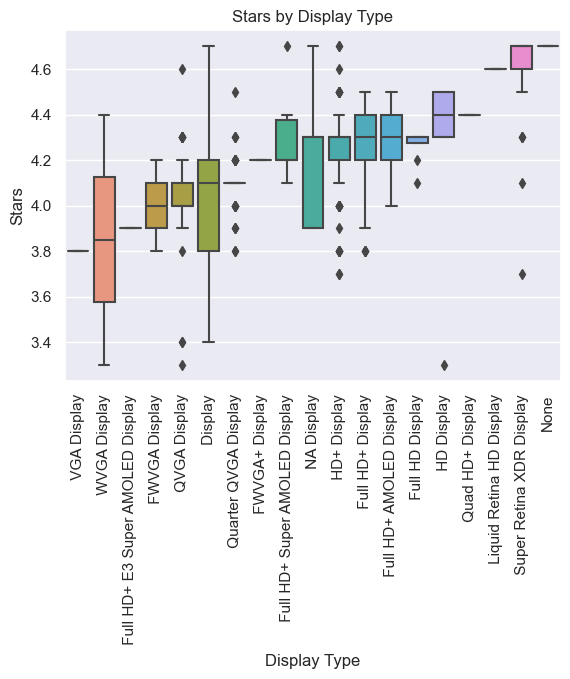

In [90]:
# box plot of Display Type according to their category
# Sort the data by the median value of Stars for each DisplayType
medians = Cleaned.groupby(['DisplayType'])['Stars'].median().sort_values()
Cleaned_sorted = Cleaned[Cleaned['DisplayType'].isin(medians.index)]

# Create a box plot with DisplayType on the x-axis and Stars on the y-axis
sb.boxplot(x="DisplayType", y="Stars", data=Cleaned_sorted, order=medians.index)

# Set the title and axis labels
plt.title("Stars by Display Type")
plt.xlabel("Display Type")
plt.ylabel("Stars")

# adjust the margins and rotate the x-axis labels
plt.subplots_adjust(bottom=0.15)
plt.xticks(rotation=90)

# Show the plot
plt.show()

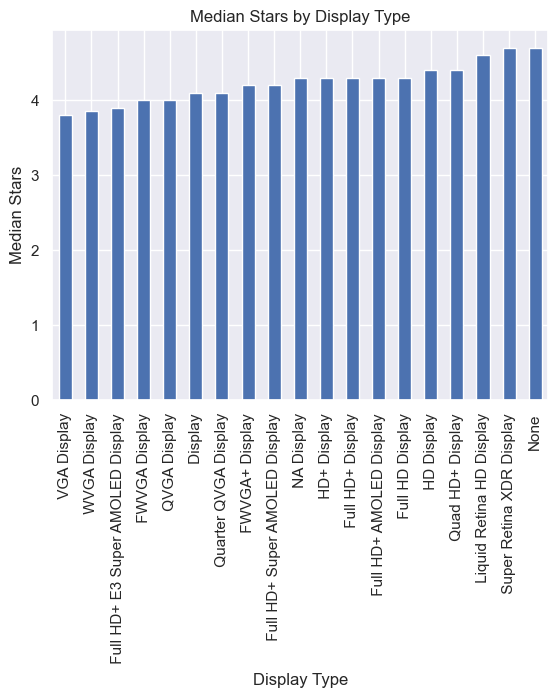

In [91]:
#plot median stars vs Display Type
# Calculate the median Stars value for each DisplayType and sort in ascending order
medians = Cleaned.groupby(['DisplayType'])['Stars'].median().sort_values(ascending=True)

# Plot the median values as a bar chart
ax = medians.plot(kind='bar')

# Set the title and axis labels
plt.title("Median Stars by Display Type")
plt.xlabel("Display Type")
plt.ylabel("Median Stars")

# Rotate the x-axis labels for readability
plt.xticks(rotation=90)

# Show the plot
plt.show()

## Stars with Brand, Battery, Price

### Battery with Stars

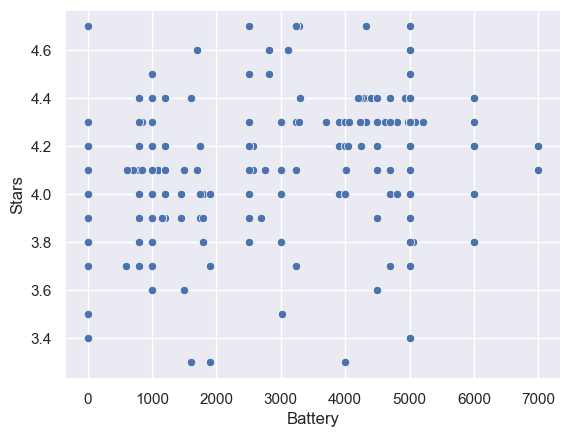

In [92]:
#Scatter plot for battery against stars

# Create the scatter plot
sb.scatterplot(x='Battery', y='Stars', data=Cleaned)

# Display the plot
plt.show()

### Battery with Stars analysis
As for the boxplot, it shows that the median value for battery as shown by the center line is very much to the right. This indicates that the battery data is heavily skewed to the right with the median being about 4800 mah. This suggests that smartphones in our data sample happens to have much higher battery capacity than normal.

As for the scatterplot for battery against stars, the heavy scatter of the points all over the graph clearly suggests that there is no clear strong relationship between battery and how users of the smartphones rate them. The circular nature of the data points is indicating that the relationship between battery and star rating is extremely weak and thus no strong conclusion can be made on how much a smartphone is valued by customers just based on its battery capacity alone. 

Thus we can safely conclude that potential buyers of smartphones do not generally value the battery capacity of their smartphones or if at all.

### Brand with Stars

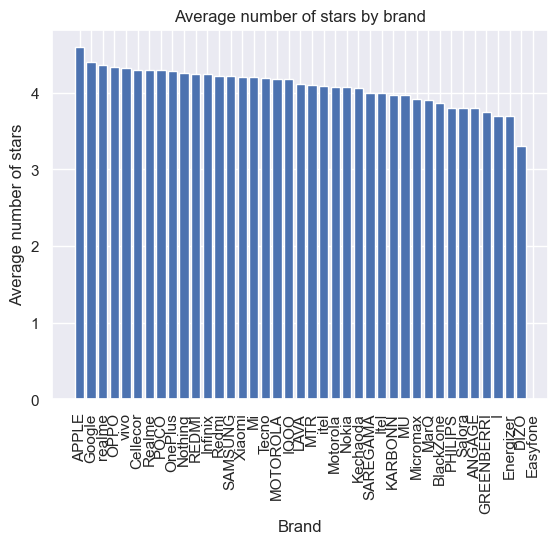

In [93]:
#Brand exploratory analysis

# Group by brand
grouped_df = Cleaned.groupby('Brand')['Stars'].mean().reset_index()

#Sort the data frame in a descending order
df_sorted = grouped_df.sort_values('Stars', ascending=False)

# Create the bar chart
plt.bar(df_sorted['Brand'], df_sorted['Stars'])

# Add axis labels and title
plt.xlabel('Brand')
plt.ylabel('Average number of stars')
plt.title('Average number of stars by brand')

#Rotate brand names
plt.xticks(rotation=90)

# Display the plot
plt.show()

In [94]:
px.scatter(x=Cleaned['Brand'],y=Cleaned['Stars'],color=Cleaned['Brand'],width=800, height=800,title="Mobile Brands and Stars")

### Brand with Stars analysis
As shown by the bar chart above, Apple has the highest average rating among the entire list of brands while the brand with the lowest average star rating was DIZO.

In general, we can conclude the more wellknown and established brands such as Apple, Google and Oppo are much more likely to be rated higher by customers compared to brands that are less established by the public.

### Price with Stars

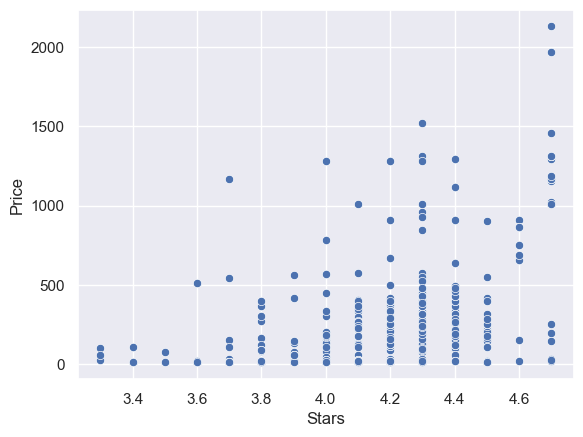

In [95]:
#Scatter plot for battery against stars

# Create the scatter plot
sb.scatterplot(x='Stars', y='Price', data=Cleaned)

# Display the plot
plt.show()

### Price with Stars analysis
As for the boxplot for price, there are way too many outliers past the 1.5 of IQR while the right tail of the boxplot being much longer than that of the left tail. This means that the majority of the price data is concentrated towards the left of the box, and there are relatively few data points with high values that are pulling the right whisker out to a longer length. This shows that prices of the smartphones ranges extremely from a very low price to a very high one.

As for the scatter plot for price against star rating, it is generally observed that there are much more cheaper phones with a star rating above 4.0. It is also observed that the higher the price of a smartphone, it is much likely for it to be rated very highly.

What we can conclude is that, users generally prefer lower priced phones and most of them are generally liked by them however when the smartphones are cheaper, it is relativley more likely to be rated below 4.0 compared to smartphones that are priced much higher.

## Complex Relationships with Stars
- Used some of the highest coorelations we have 

### Ram&Rom Vs Stars

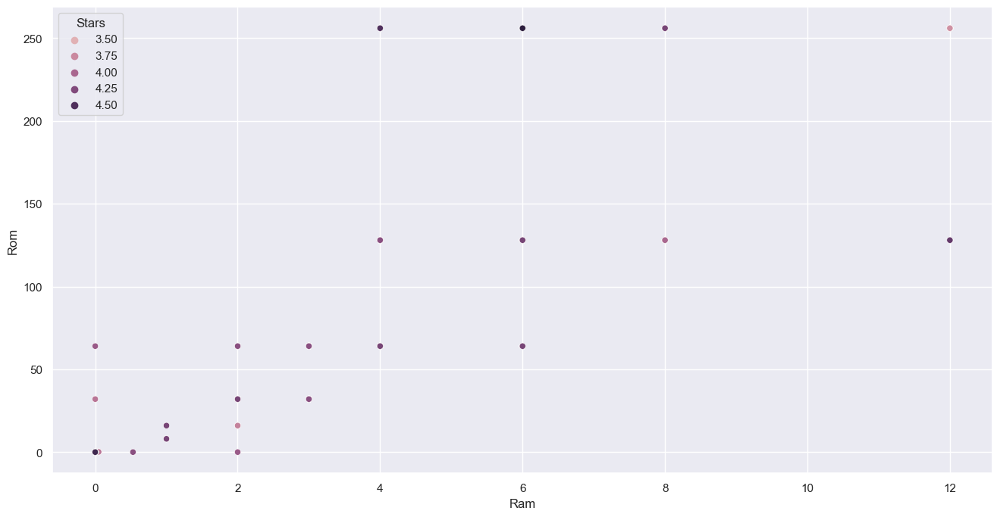

In [96]:


f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Ram', y = 'Rom', hue = 'Stars', data = Cleaned)
plt.show()

-Generally as rom increase, ram increase. however there doesnt seem to have a relation between stars

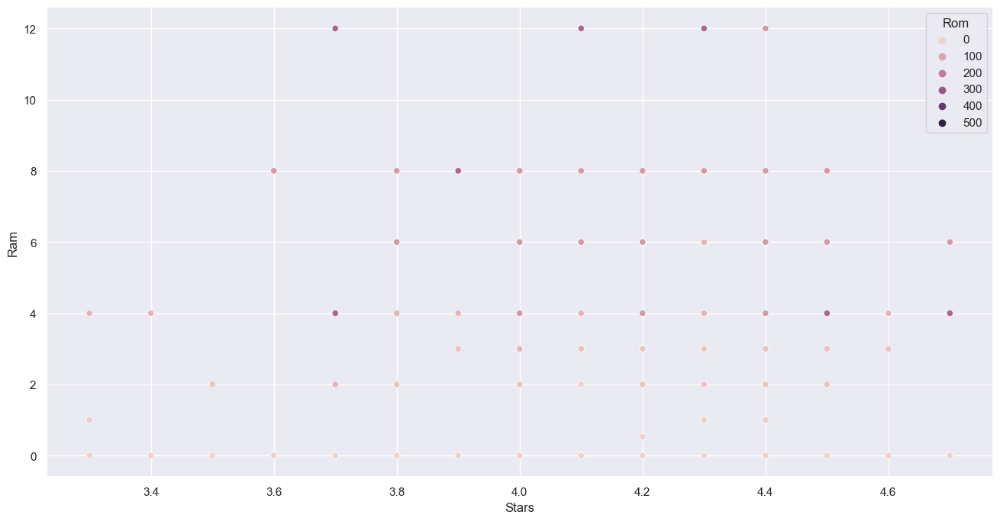

In [97]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Stars', y = 'Ram', hue = 'Rom', data = Cleaned)
plt.show()

Still no obvious relation of the stars and ram/rom

### ScreenSize&Battery Vs Stars

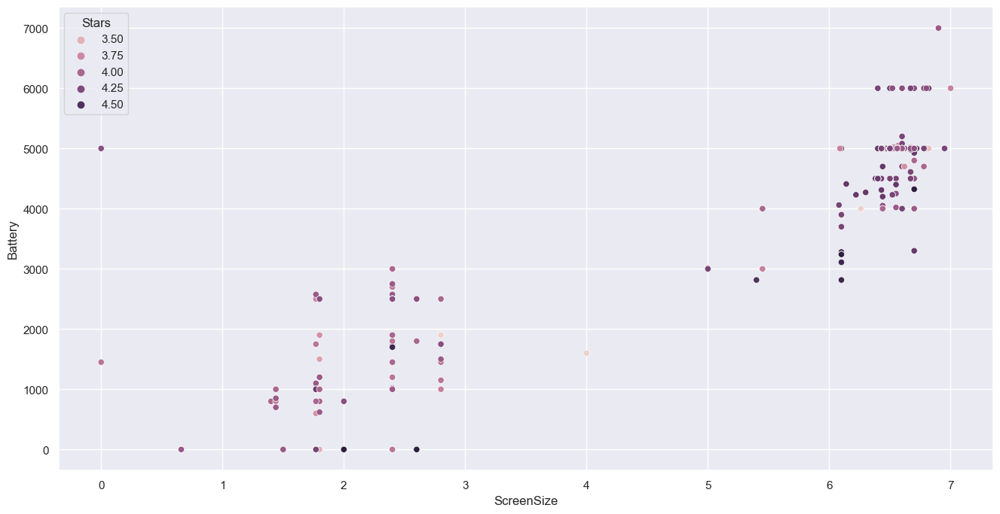

In [98]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'ScreenSize', y = 'Battery', hue = 'Stars', data = Cleaned)
plt.show()

- generally as battery and screenSize increases, The shade of the stars also darken depicting higher stars <br>
- they are good predictors for stars

### Price&Rom Vs Stars

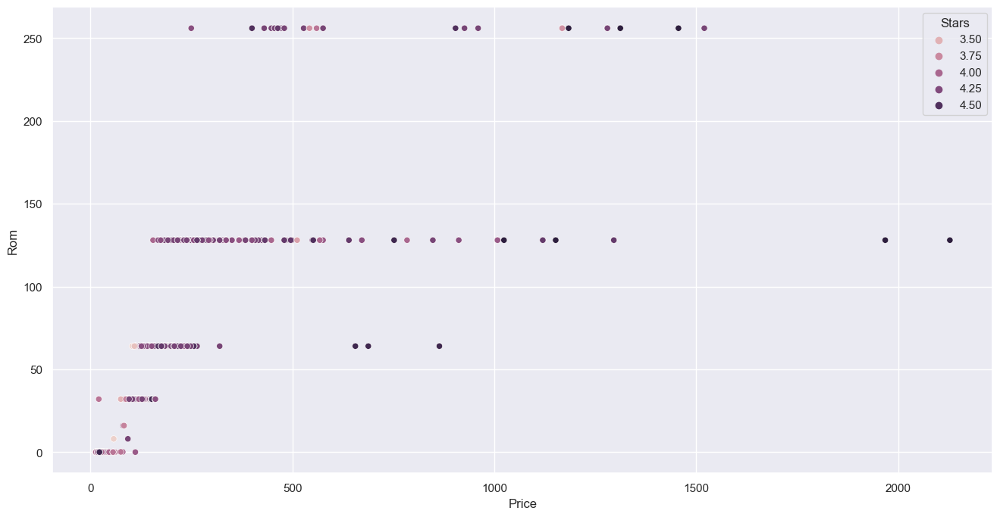

In [99]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Price', y = 'Rom', hue = 'Stars', data = Cleaned)
plt.show()

- generally the higher price for each rom size  have higher stars
- they might be good predictors for stars

.

.

# Model Selection & attempts
# ****REMEMBER TO DUPLICATE THE CLEANED DATAFRAME FOR UR MODEL. DO NOT USE CLEANED (For group members only)

### do ur model n analysis (Instructions for group members)

attempt 1: split into 80/20 & fit in model. isit good? why? MSE? how accurate? <br>
attempt 2: cleaning to improve the accuracy. what you do? did it improve? improve by how much? (Note: even if it didnt improve its okay, keep the attempt and just say y u think didnt) <br>
attempt 3: continue to improve the accuracy. what you do? did it improve? improve by how much? (Note: even if it didnt improve its okay, keep the attempt and just say y u think didnt)<br>

- thing u can try to improve: <br>
1. fit in more predictors <br>
2. increase the depth of ur forest <br>
3. remove outliers <br>
4. replace NA or Remove NA <br>

# Section 4: Model 1, K Nearest Neighbours 
Attempt 5 & 6 uses KNN model with GridSearchCV <br>
Attempt 7 uses KNN model with Bagging model

Brief Summary <br>
K Nearest Neighbours is chosen as the first model because it is considered a good model with accurate prediction as It makes predictions based on the distance between the nearest data points. And does not make any assumptions and adapts to changes. Therefore i believe that it is a good model to predict the Stars rating. <br>

Attempt 5: GridSearchCV is implemented with KNN Model to find the best number of neighbours and see if there is any improvements<br>

Attempt 6: For GridSearchCV I'll test whether using a weighted average for prediction as opposed to a regular average will improve the performance of my model. This implies that distant neighbours will have less of an impact on the prediction. <br>

Attempt 7: Bagging Model is used as it is a relatively simple machine learning model is fitted to a large number of different models using an ensemble method. It modifies each fit slightly. Decision trees are frequently used in bagging, but kNN works just as well. Performance-wise, ensemble methods frequently outperform individual models. One model might occasionally be off, but on average, a hundred models should be off less frequently. The predictions will be less erratic as the errors of various individual models are likely to average out. Therefore Bagging is used together with Knn. (Reference from https://realpython.com/knn-python/)

### Model 1: K Nearest Neighbours Attempt 1 (2 neighbours, 3 Predictor-ScreenSize, Ram, Rom)

In [100]:
correlation_matrix = Cleaned.corr()
correlation_matrix["Stars"]

Unnamed: 0     -0.210864
Stars           1.000000
Ram             0.474569
Rom             0.477503
Rear Camera     0.340169
Front Camera    0.383422
ScreenSize      0.549877
Price           0.494330
Battery         0.495736
Name: Stars, dtype: float64

#### Since ScreenSize, Price, Battery, Ram & Rom got the highest correlation, they are chosen as predictors

In [101]:
kNN = Cleaned.copy()

#replace NaN in stars with median
print("Median of Stars:",median(Cleaned["Stars"]))
print("percentage of NaN in Stars: ", (943-922)/943*100, "%")
print()
kNN["Stars"].fillna(median(kNN["Stars"]), inplace=True)
#print(kNN['Stars'])
kNN.info()

Median of Stars: 3.9
percentage of NaN in Stars:  2.2269353128313893 %

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         943 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


##### Since only 2% is null we can replace the data with median

Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.040885278514588876
The RMSE for train:  0.20220108435562079
kNN Model Score for train:  0.24749171296474648

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.05541005291005293
The RMSE for test:  0.23539340031116618
kNN Model Score for test:  0.11772984996121982


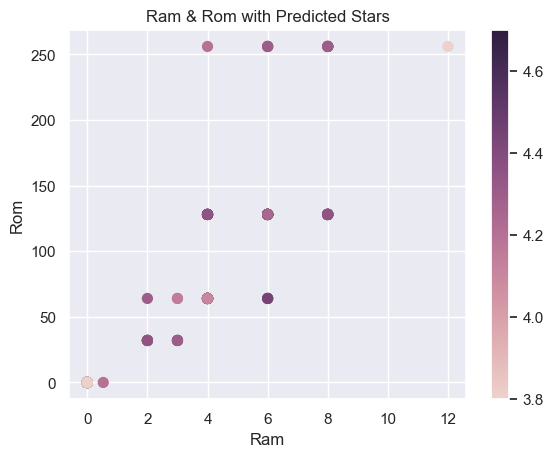

In [102]:
#split into 80% & 20%
# Extract Response and Predictors
y = pd.DataFrame(kNN["Stars"])
x = pd.DataFrame(kNN[["ScreenSize","Ram","Rom"]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)
#kNN.info()


#fitting into model with 2 neighbours
knn_model = KNeighborsRegressor(n_neighbors=2)
knn_model.fit(X_train, y_train)

train_preds = knn_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("kNN Model Score for train: ", knn_model.score(X_train, y_train))
print()

test_preds = knn_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("kNN Model Score for test: ", knn_model.score(X_test, y_test))

#plotting graph
cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Ram")
ax.set_ylabel("Rom")
ax.set_title("Ram & Rom with Predicted Stars")
plt.show()

#X_train.info()

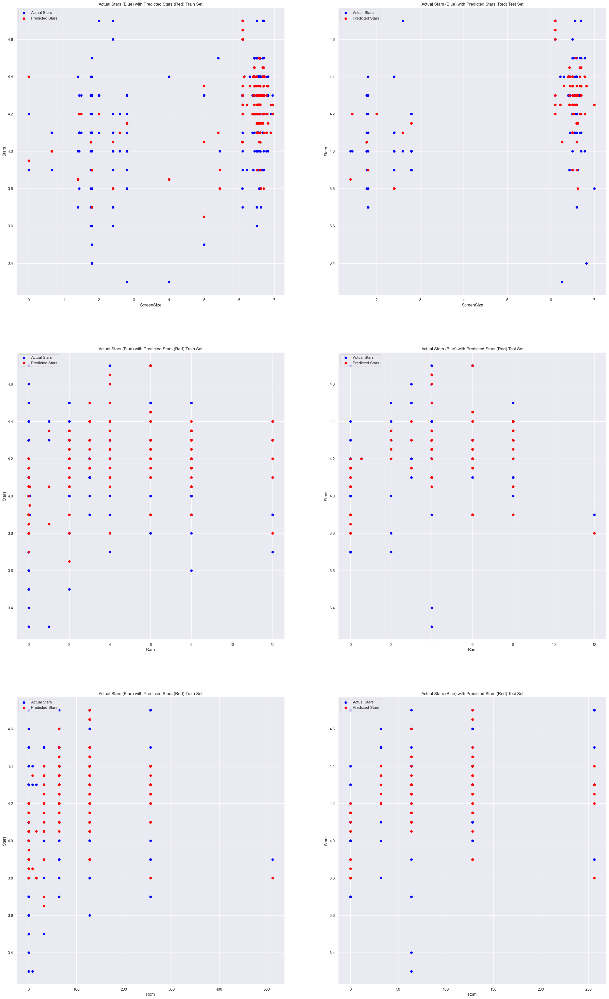

In [103]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
#axes[0].plot(X_train, y_train_pred, linewidth = 5, color ="red")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
#axes[0].plot(X_train, y_train_pred, linewidth = 5, color ="red")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")


#ram
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Ram")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Ram")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#rom
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Rom")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Rom")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")


plt.show()

#### Attempt 1: Summary
- used 3 predictor: ScreenSize, Ram, Rom
- ScreenSize is used as it have the highest correlation with stars
- Ram and rom is used as they are closely related to each other, therefore the graphs will have a better depict f the relationship
- na rows is replaced with median
- the mse is very low but we can see how we might improve by adding more predictor and more neighbours

### Model 1: K Nearest Neighbours Attempt 2 (3 neighbours, 3 Predictor-ScreenSize, Price, Battery)

Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.019030356616563514
The RMSE for train:  0.13795055859460487
kNN Model Score for train:  0.6713592985366561

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.03146972369194593
The RMSE for test:  0.17739707915280323
kNN Model Score for test:  0.3222171307294369


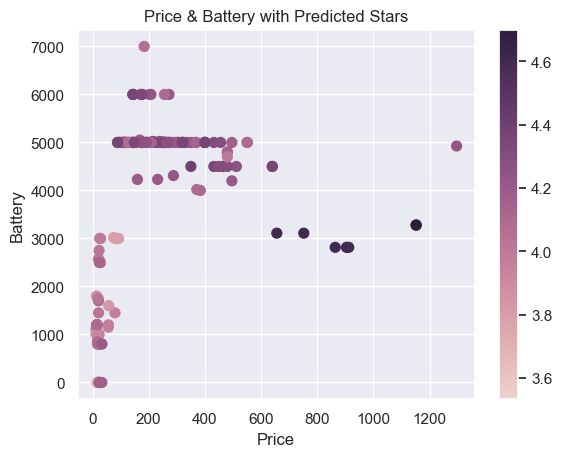

In [104]:

# Extract Response and Predictors
y = pd.DataFrame(kNN["Stars"])
x = pd.DataFrame(kNN[["ScreenSize","Price","Battery",]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

#fitting into model with 3 neighbours
knn_model = KNeighborsRegressor(n_neighbors=3)
knn_model.fit(X_train, y_train)



train_preds = knn_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("kNN Model Score for train: ", knn_model.score(X_train, y_train))
print()

test_preds = knn_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("kNN Model Score for test: ", knn_model.score(X_test, y_test))

cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

#X_train.info()

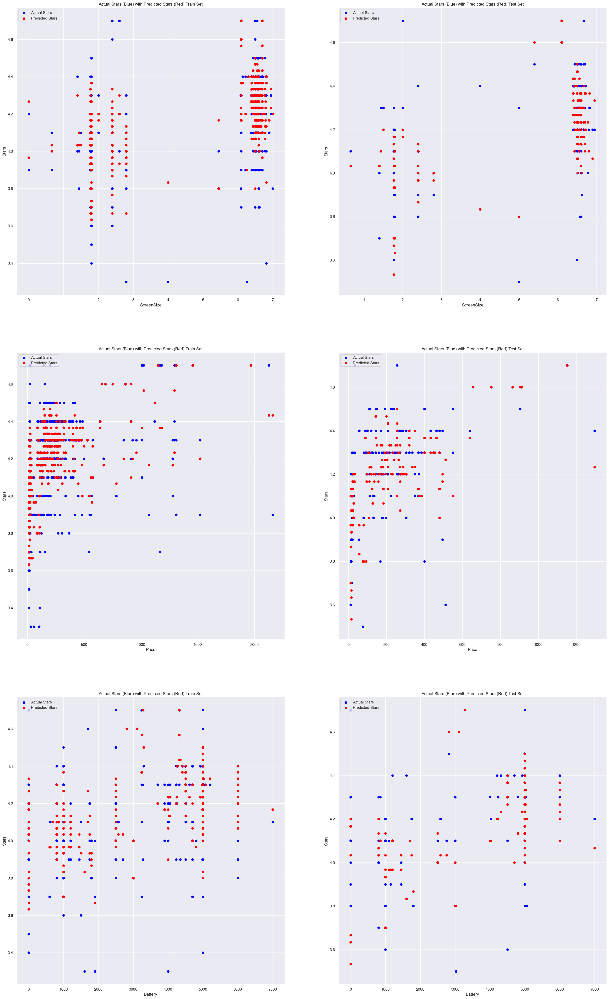

In [105]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")

#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")
plt.show()

#### Attempt 2: Summary
- used 3 predictor: ScreenSize, Price, battery and increase the number of neighbours
- ScreenSize is used as it have the highest correlation with stars
- Ram and rom is used as they are closely related to each other, therefore the graphs will have a better depict f the relationship
- na rows is replaced with median
- the mse for test decrease from 0.05 to 0.031 which means the accuracy improved
- we will try to improve the accuracy by putting in more predictor

### Model 1: K Nearest Neighbours Attempt 3 (3 neighbours, 3 Predictor-ScreenSize, Price, Battery)
- DIfference with Attept 2: Instead of replacing NaN with median i remove it
- reason for doing so is because we are predicting the Stars, and replacing it with median doesnt seem resonable in this case as it is not like a time series where the data is in sequence.

In [106]:
#instead of replacing the null with median, i will try removing the null to see if accuracy increase
kNN1 = Cleaned.dropna(subset=['Stars'])
kNN1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 922 entries, 0 to 1141
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    922 non-null    int64  
 1   Names         922 non-null    object 
 2   Stars         922 non-null    float64
 3   Processor     922 non-null    object 
 4   Brand         922 non-null    object 
 5   Color         922 non-null    object 
 6   Ram           922 non-null    float64
 7   Rom           922 non-null    float64
 8   Expandable    922 non-null    object 
 9   Rear Camera   922 non-null    float64
 10  Front Camera  922 non-null    float64
 11  ScreenSize    922 non-null    float64
 12  DisplayType   922 non-null    object 
 13  Price         922 non-null    float64
 14  Battery       922 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 115.2+ KB


Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.017235036936529474
The RMSE for train:  0.1312822795983124
kNN Model Score for train:  0.684115375527897

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.0377117117117117
The RMSE for test:  0.19419503523960568
kNN Model Score for test:  0.36371270158971203


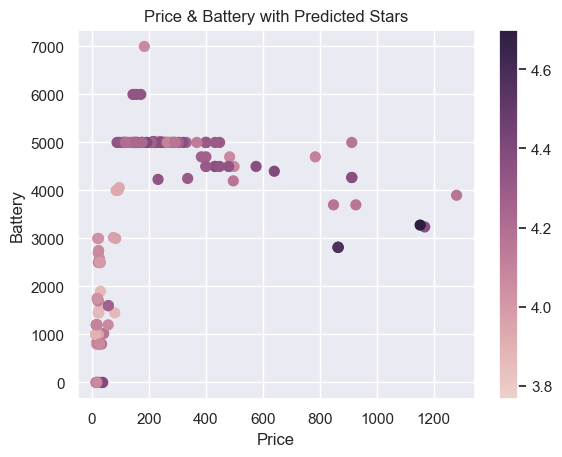

In [107]:
#kNN1 = Cleaned['Stars'].dropna

# Extract Response and Predictors
y = pd.DataFrame(kNN1["Stars"])
x = pd.DataFrame(kNN1[["ScreenSize","Price","Battery",]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

#fitting into model with 3 neighbours
knn_model = KNeighborsRegressor(n_neighbors=3)
knn_model.fit(X_train, y_train)



train_preds = knn_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("kNN Model Score for train: ", knn_model.score(X_train, y_train))
print()

test_preds = knn_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("kNN Model Score for test: ", knn_model.score(X_test, y_test))

cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

#X_train.info()

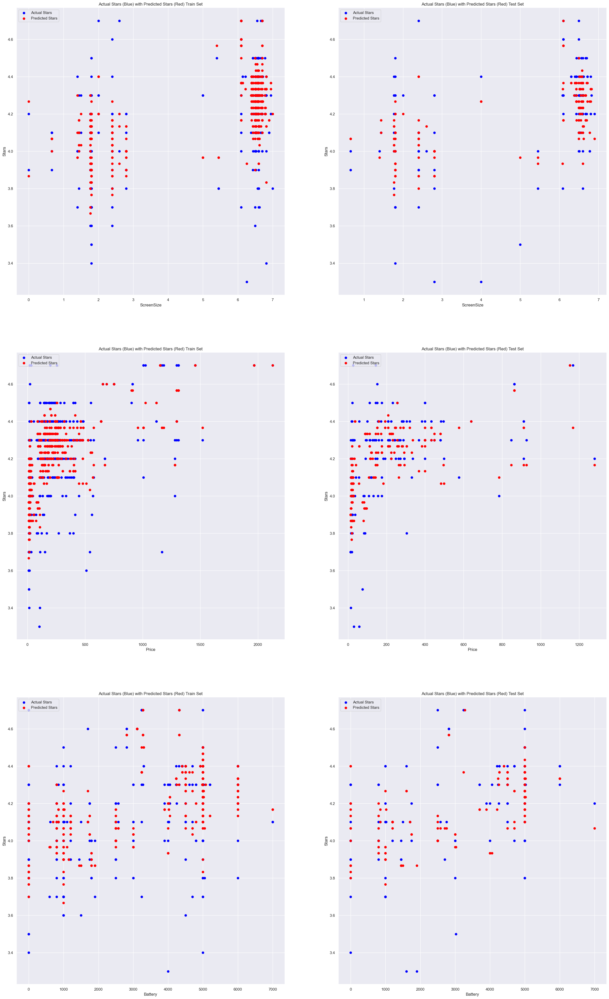

In [108]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")

#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")
plt.show()

#### Attempt 3: Summary
- used 3 predictor: ScreenSize, Price, battery and increase the number of neighbours
- ScreenSize is used as it have the highest correlation with stars
- Ram and rom is used as they are closely related to each other, therefore the graphs will have a better depict of the relationship
- na rows is removed instead of replacing it with median
- the mse for test decrease from 0.036 to 0.032 which means the accuracy improved
- reason for doing so is because we are predicting the Stars, and replacing it with median doesnt seem resonable in this case as it is not like a time series where the data is in sequence.

- next i will try improving the accuracy by fitting in more predictors

### Model 1: K Nearest Neighbours Attempt 4 (3 neighbours, 5 Predictors-ScreenSize, Price, Battery, Ram, Rom)

Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.014248454696215891
The RMSE for train:  0.11936689112235391
kNN Model Score for train:  0.7466409327809722

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.04744744744744745
The RMSE for test:  0.21782434998743241
kNN Model Score for test:  0.09711719993278611


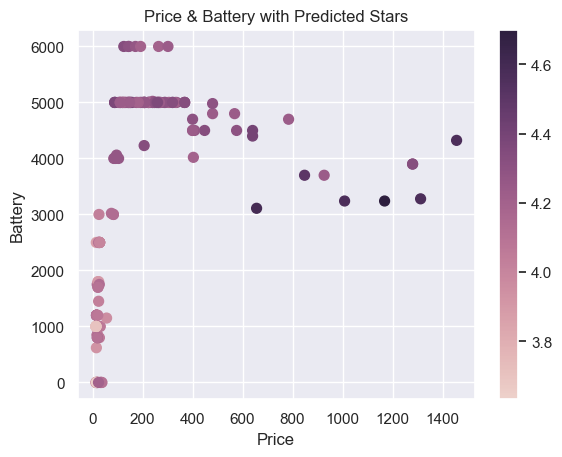

In [109]:
# Extract Response and Predictors
y = pd.DataFrame(kNN1["Stars"])
x = pd.DataFrame(kNN1[["ScreenSize","Price","Battery","Ram", "Rom"]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

#fitting into model with 3 neighbours
knn_model = KNeighborsRegressor(n_neighbors=3)
knn_model.fit(X_train, y_train)



train_preds = knn_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("kNN Model Score for train: ", knn_model.score(X_train, y_train))
print()

test_preds = knn_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("kNN Model Score for test: ", knn_model.score(X_test, y_test))

cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

#X_train.info()

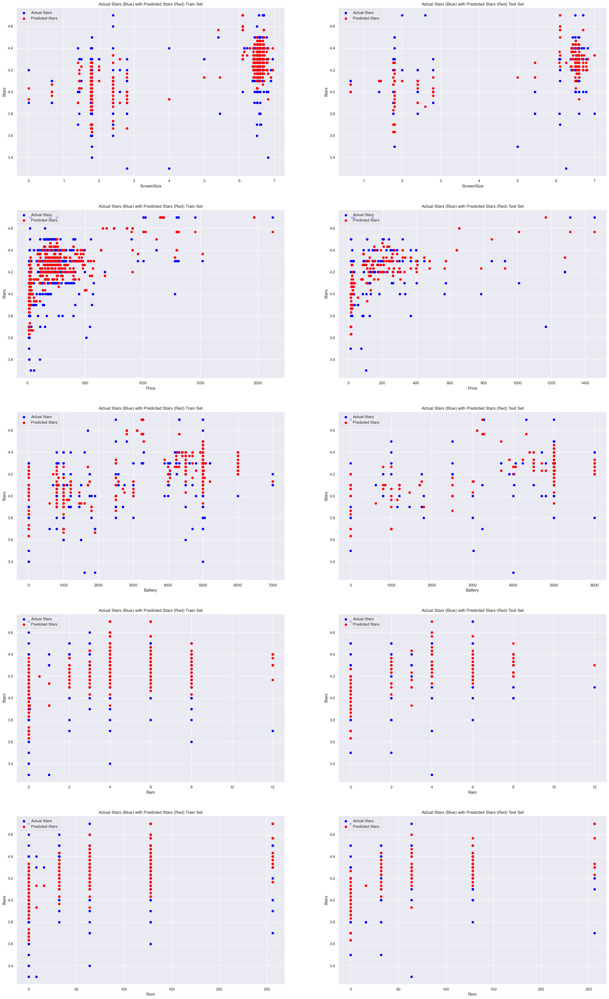

In [110]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(5, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")

axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")


#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")

axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")

axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")


#Ram
axes[3][0].scatter(X_train.iloc[:, 3].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[3][0].scatter(X_train.iloc[:, 3], train_preds, color = "red", label="Predicted Stars")
axes[3][0].set_xlabel("Ram")
axes[3][0].set_ylabel("Stars")
axes[3][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[3][0].legend(loc="upper left")

axes[3][1].scatter(X_test.iloc[:, 3].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[3][1].scatter(X_test.iloc[:, 3], test_preds, color = "red", label="Predicted Stars")
axes[3][1].set_xlabel("Ram")
axes[3][1].set_ylabel("Stars")
axes[3][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[3][1].legend(loc="upper left")


#Rom
axes[4][0].scatter(X_train.iloc[:, 4].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[4][0].scatter(X_train.iloc[:, 4], train_preds, color = "red", label="Predicted Stars")
axes[4][0].set_xlabel("Rom")
axes[4][0].set_ylabel("Stars")
axes[4][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[4][0].legend(loc="upper left")

axes[4][1].scatter(X_test.iloc[:, 4].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[4][1].scatter(X_test.iloc[:, 4], test_preds, color = "red", label="Predicted Stars")
axes[4][1].set_xlabel("Rom")
axes[4][1].set_ylabel("Stars")
axes[4][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[4][1].legend(loc="upper left")

plt.show()

#### Attempt 4: Summary
- used 5 predictors: ScreenSize, Price, battery, Ram, Rom
- ScreenSize is used as it have the highest correlation with stars
- Ram and rom is used as they are closely related to each other, therefore the graphs will have a better depiction of the relationship
- na rows is removed
#### - the mse for test increased from 0.032 to 0.039 which means the accuracy got worse
#### - Reason for this might be because of overfitting, therefore more predictors does not always result in a better prediction

- next i will try improving the accuracy by reverting back to using attempt 3 and try GridSearchCV to find the best k

### Model 1: K Nearest Neighbours Attempt 5 - GridSearchCV for k Neighbour & using attempt 3

#### GridSearchCV is used to help us frind the best number of K Neighbours <br>
We test with gridsearch CV to see if there is any improvement

In [111]:
# Extract Response and Predictors
y = pd.DataFrame(kNN1["Stars"])
x = pd.DataFrame(kNN1[["ScreenSize","Price","Battery"]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

#fitting into model with 3 neighbours
knn_model = KNeighborsRegressor(n_neighbors=3)
knn_model.fit(X_train, y_train)

#GridSearchCV
parameters = {"n_neighbors": range(1, 50)}
gridsearch = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch.fit(X_train, y_train)

#kNN1.info()

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50)})

In [112]:
gridsearch.best_params_

{'n_neighbors': 16}

Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.027057440072365446
The RMSE for train:  0.16449145896479078
GridSearch Model Score for train:  0.5221912080798052

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.028646246246246263
The RMSE for test:  0.1692520199177731
GridSearch Model Score for test:  0.41054645252508526


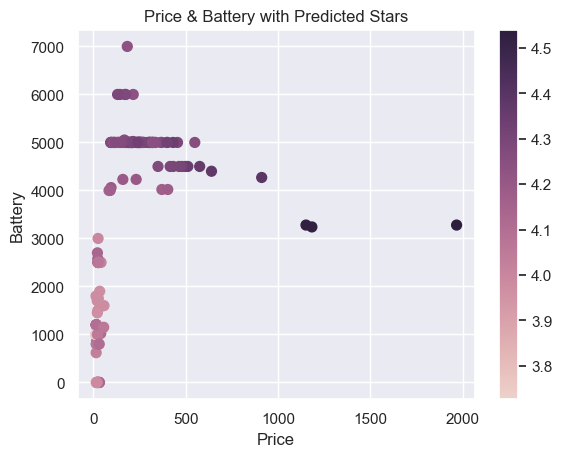

In [113]:
#fitting into model with 15 neighbours
knn_model = KNeighborsRegressor(n_neighbors=15)
knn_model.fit(X_train, y_train)

#GridSearchCV
parameters = {"n_neighbors": range(1, 50)}
gridsearch = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch.fit(X_train, y_train)


train_preds = knn_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("GridSearch Model Score for train: ", gridsearch.score(X_train, y_train))
print()

test_preds = knn_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("GridSearch Model Score for test: ", gridsearch.score(X_test, y_test))

cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

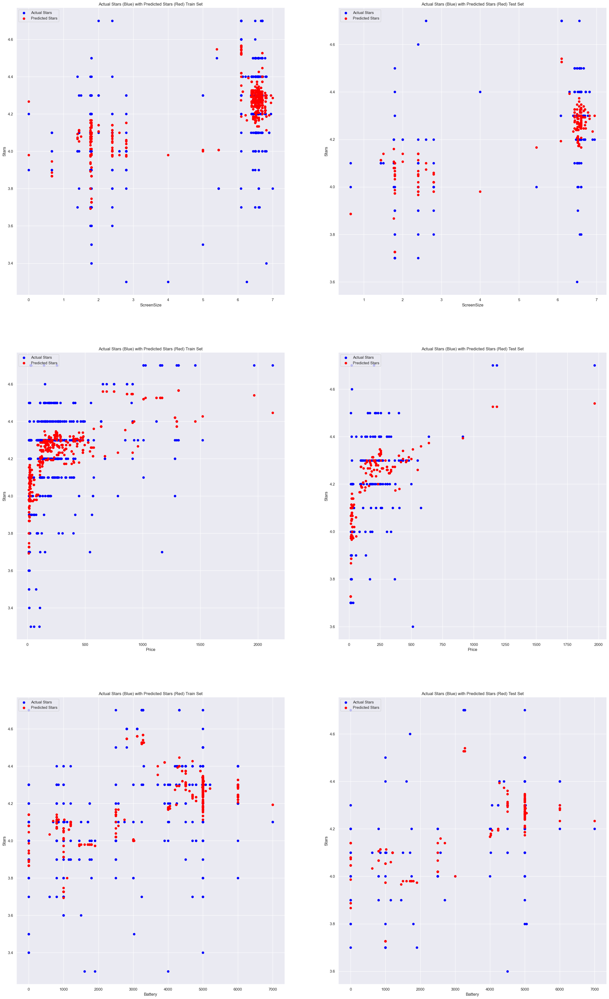

In [114]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")

#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")
plt.show()

#### Attempt 5: Summary
#### From GridSearchCV we can see that the best number of neighbours is 15 for kNN model
- from the graph we observe that the points are more culstered 
- eventhough the gridsearch CV says the best is 15 neighbours but the accuracy mse for the model increase

- next i will try Adding Weighted Average of Neighbors Based on Distance to see if the accuracy increase.

### Model 1: K Nearest Neighbours Attempt 6 - Adding Weighted Average of Neighbors Based on Distance
<br>
For GridSearchCV I'll test whether using a weighted average for prediction as opposed to a regular average will improve the performance of my model. This implies that distant neighbours will have less of an impact on the prediction. <br>

Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.02568935624905774
The RMSE for train:  0.1602789950338401
GridSearch Score for train:  0.5475325449675335

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.02833821321321321
The RMSE for test:  0.16833957708516797
GridSearch Score for test:  0.4285303994778208


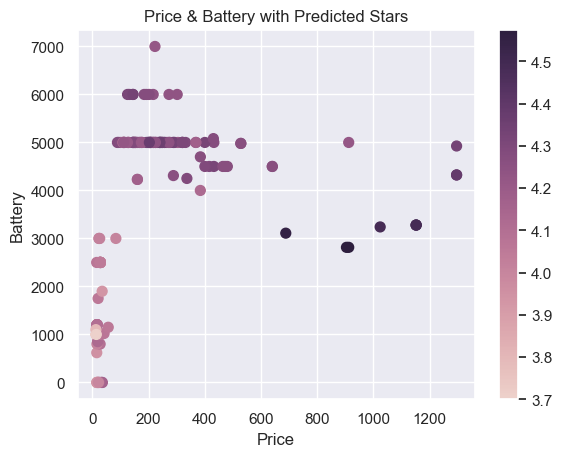

In [115]:
# Extract Response and Predictors
y = pd.DataFrame(kNN1["Stars"])
x = pd.DataFrame(kNN1[["ScreenSize","Price","Battery"]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

parameters = {"n_neighbors": range(1, 50),"weights": ["uniform", "distance"]}
gridsearch = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch.fit(X_train, y_train)
gridsearch.best_params_

train_preds = gridsearch.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("GridSearch Score for train: ", gridsearch.score(X_train, y_train))

print()

test_preds = gridsearch.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("GridSearch Score for test: ", gridsearch.score(X_test, y_test))

cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

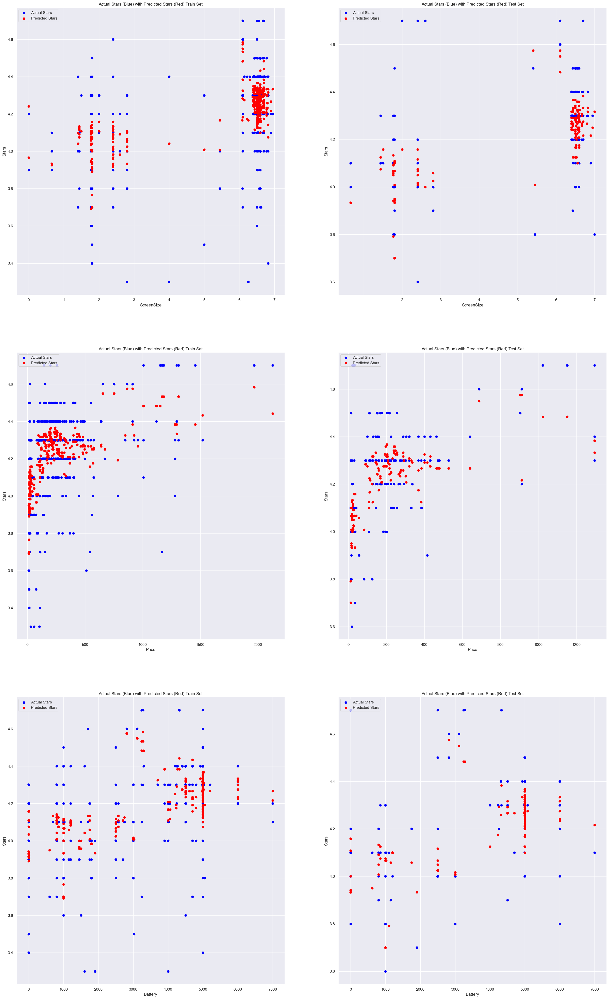

In [116]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")

#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")
plt.show()

#### Attempt 6: Summary
#### From GridSearchCV with Weighted Average of Neighbors based on distancee
- from the graph we observe that the plot is very similar to attempt 5
- however the mse increased slightly from 0.028 to 0.029

- next i will try to further Improving on kNN in scikit-learn With Bagging

### Model 1: K Nearest Neighbours Attempt 7 - Improving on kNN in scikit-learn With Bagging

Testing with bagging model to see if there will be any improvements. Bagging is choosen before of the following reasons: <br>

Bagging Model is used as it is a relatively simple machine learning model is fitted to a large number of different models using an ensemble method. It modifies each fit slightly. Decision trees are frequently used in bagging, but kNN works just as well. <br>
<br>
Performance-wise, ensemble methods frequently outperform individual models. One model might occasionally be off, but on average, a hundred models should be off less frequently. The predictions will be less erratic as the errors of various individual models are likely to average out. 

<br>Therefore Bagging is used together with Knn. (Reference from https://realpython.com/knn-python/)

C:\Users\haoku\anaconda3\lib\site-packages\sklearn\ensemble\_bagging.py:429: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Goodness of Fit of Model 	Train Dataset
The MSE for train:  0.024628177681667425
The RMSE for train:  0.15693367287382087
Bagging Model Score for train:  0.5381133544606177

Goodness of Fit of Model 	Test Dataset
The MSE for test:  0.03268363562312313
The RMSE for test:  0.1807861599324548
Bagging Model Score for test:  0.4887346637408525


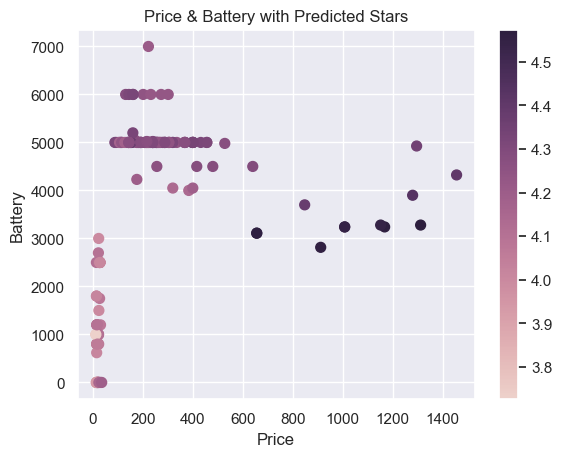

In [117]:
# Extract Response and Predictors
y = pd.DataFrame(kNN1["Stars"])
x = pd.DataFrame(kNN1[["ScreenSize","Price","Battery"]])

#split into 80% & 20%
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

#using bagging model
best_k = gridsearch.best_params_["n_neighbors"]
best_weights = gridsearch.best_params_["weights"]
bagged_knn = KNeighborsRegressor(n_neighbors=best_k, weights=best_weights)
bagging_model = BaggingRegressor(bagged_knn, n_estimators=100)
bagging_model.fit(X_train, y_train)

train_preds = bagging_model.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTrain Dataset")
print("The MSE for train: ", mse)
print("The RMSE for train: ", rmse)
print("Bagging Model Score for train: ", bagging_model.score(X_train, y_train))

print()

test_preds = bagging_model.predict(X_test)
mse = mean_squared_error(y_test, test_preds)
rmse = sqrt(mse)
print("Goodness of Fit of Model \tTest Dataset")
print("The MSE for test: ", mse)
print("The RMSE for test: ", rmse)
print("Bagging Model Score for test: ", bagging_model.score(X_test, y_test))


cmap = sb.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_test.iloc[:, 1].values, X_test.iloc[:, 2].values, c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
ax.set_xlabel("Price")
ax.set_ylabel("Battery")
ax.set_title("Price & Battery with Predicted Stars")
plt.show()

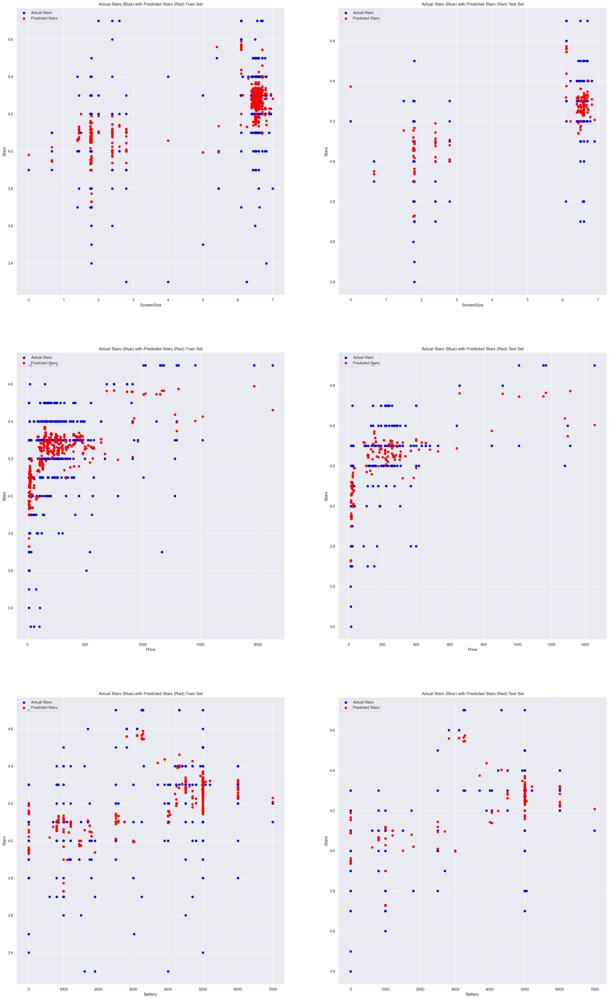

In [118]:
# Plot the Predictions vs the True values. Using screenSize as x axis as it have the highest correlation
#blue is original value, red is predicted value

#screenSize
f, axes = plt.subplots(3, 2, figsize=(30, 50))
axes[0][0].scatter(X_train.iloc[:, 0].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][0].scatter(X_train.iloc[:, 0], train_preds, color = "red", label="Predicted Stars")
axes[0][0].set_xlabel("ScreenSize")
axes[0][0].set_ylabel("Stars")
axes[0][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[0][0].legend(loc="upper left")


axes[0][1].scatter(X_test.iloc[:, 0].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[0][1].scatter(X_test.iloc[:, 0], test_preds, color = "red", label="Predicted Stars")
axes[0][1].set_xlabel("ScreenSize")
axes[0][1].set_ylabel("Stars")
axes[0][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[0][1].legend(loc="upper left")

#Price
axes[1][0].scatter(X_train.iloc[:, 1].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][0].scatter(X_train.iloc[:, 1], train_preds, color = "red", label="Predicted Stars")
axes[1][0].set_xlabel("Price")
axes[1][0].set_ylabel("Stars")
axes[1][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[1][0].legend(loc="upper left")


axes[1][1].scatter(X_test.iloc[:, 1].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[1][1].scatter(X_test.iloc[:, 1], test_preds, color = "red", label="Predicted Stars")
axes[1][1].set_xlabel("Price")
axes[1][1].set_ylabel("Stars")
axes[1][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[1][1].legend(loc="upper left")


#Battery
axes[2][0].scatter(X_train.iloc[:, 2].values, y_train.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][0].scatter(X_train.iloc[:, 2], train_preds, color = "red", label="Predicted Stars")
axes[2][0].set_xlabel("Battery")
axes[2][0].set_ylabel("Stars")
axes[2][0].set_title("Actual Stars (Blue) with Predicted Stars (Red) Train Set")
axes[2][0].legend(loc="upper left")


axes[2][1].scatter(X_test.iloc[:, 2].values, y_test.iloc[:,0].values, color = "blue",label="Actual Stars")
axes[2][1].scatter(X_test.iloc[:, 2], test_preds, color = "red", label="Predicted Stars")
axes[2][1].set_xlabel("Battery")
axes[2][1].set_ylabel("Stars")
axes[2][1].set_title("Actual Stars (Blue) with Predicted Stars (Red) Test Set")
axes[2][1].legend(loc="upper left")
plt.show()

#### Attempt 7: Summary
#### Bagging Model with K Nearest Neighbours
- from the graph we observe that the plot is very similar to attempt 5
- however the mse did not change from attempt 6
- thus accuracy did not improve


### Model 1: Conclusion

MSE For Test dataset For Each Attempt
- attempt 1: 0.0554 (2 kNearestNeighbours, 3 Predictor-ScreenSize, Ram, Rom)
- attempt 2: 0.0314 (3 kNearestNeighbours, 3 Predictor-ScreenSize, Price, Battery. Replace NaN with median)
- attempt 3: 0.0377 (3 kNearestNeighbours, 3 Predictor-ScreenSize, Price, Battery. Remove NaN instead into)
- attempt 4: 0.0474 (3 kNearestNeighbours, 5 Predictors-ScreenSize, Price, Battery, Ram, Rom)
- attempt 5: 0.0286 (GridSearchCV model for k Neighbour & using attempt 3)
- attempt 6: 0.0283 (Adding Weighted Average of Neighbors Based on Distance)
- attempt 7: 0.0326 (Improving on kNN Model With Bagging model)

#### Best attempt is number 6 with the lowest MSE of 0.0283.
- it uses 3 nearest neighbours with 3 predictor - ScreenSize, Price, Battery
- using GridSearchCV with KNN and Adding Weighted Average of Neighbors Based on Distance¶
- this is the best outcome for the k Nearest Neighbour Model